# Aprendizaje Automático - Práctica 2 - Experimentación con agrupamiento y detección de anomalías  no supervisada

#### Valoración máxima: 10 puntos

#### Fecha límite de entrega: 19 de Mayo de 2024 a las 23:59

#### Entrega a través de https://pradogrado2324.ugr.es/

### Nombre completo: <mark>Pablo Gálvez Ortigosa</mark>



---


**Normas de desarrollo y entrega de trabajos**

- Única y exclusivamente se debe entregar este Notebook de Colab (fichero `.ipynb`) o, en su defecto, tres Notebooks de Colab (uno con cada ejercicio). No es necesario entregar ninguna memoria externa (por ejemplo, en `.pdf`).

- El código debe estar bien comentado (explicando lo que realizan los distintos apartados y/o bloques), y todas las decisiones tomadas y el trabajo desarrollado (incluyendo los conceptos fundamentales subyacentes) deben documentarse ampliamente en celdas de texto. Es obligatorio documentar las valoraciones y decisiones adoptadas en el desarrollo de cada uno de los apartados. Debe incluirse también tanto una descripción de las principales funciones (Python/scikit-learn) empleadas (para mostrar que el alumno comprende, a nivel técnico, lo que está haciendo), como una valoración razonada sobre la calidad de los resultados obtenidos. Sin esta documentación, se considera que el trabajo NO ha sido presentado.

- La entrega en PRADO está configurada para permitir sucesivas entregas de la práctica. Desde este punto de vista, se recomienda subir versiones de la práctica a medida que se van realizando los distintos ejercicios propuestos, y no dejarlo todo para el final.  

- Se debe respetar la estructura y secciones del Notebook. Esto servirá para agilizar las correcciones, así como para identificar con facilidad qué ejercicio/apartado se está respondiendo.

- El código NO puede escribir nada a disco.

- El path de lectura desde Google Drive debe ser siempre el mismo, que es el que se indica en este Notebook.

- Una entrega es apta para ser corregida si se puede ejecutar de principio a fin sin errores. Es decir, un ejercicio con errores de ejecución tendrá una calificación de 0.

- No es válido usar opciones en las entradas (es decir, utilizar el comando `input()`, por ejemplo, para que el usuario escoja el valor de las variables para ejecutar el programa). Para ello, se deben fijar al comienzo los valores por defecto que se consideren óptimos o que se soliciten en el enunciado.

- Se entrega solamente este Notebook, y no los datos empleados.


---

## <font color='blue'>Ejercicio 1: OPTIMIZANDO k-MEANS y DBSCAN (4 puntos)</font>

<font color='blue'>La optimización de algoritmos de clustering como k-Means y DBSCAN en aprendizaje automático es fundamental para abordar aplicaciones reales debido a varias razones críticas. Primero, estas técnicas son ampliamente aplicadas en la segmentación de clientes, detección de anomalías, sistemas de recomendación, y otras áreas donde la agrupación efectiva de datos es crucial para extraer _insights_ significativos y tomar decisiones informadas. Optimizar estos algoritmos permite manejar grandes volúmenes de datos de manera eficiente, mejorando la velocidad y reduciendo los costos computacionales, lo cual es esencial en entornos donde el tiempo y los recursos son limitados. Además, al afinar estos métodos para incrementar su precisión y sensibilidad, se pueden identificar patrones y tendencias con mayor exactitud, lo que resulta en modelos más robustos y confiables. En un mundo donde los datos crecen exponencialmente, la capacidad de procesar y analizar esta información de manera efectiva es clave para el éxito en diversas aplicaciones prácticas, haciendo de la optimización y uso (incluso como parte de estrategias complejas de entrenamiento) de algoritmos de _clustering_ un componente indispensable en el campo del _machine learning_.

<font color='blue'>En este ejercicio intentaremos profundizar un poco en cómo optimizar y operar con dos algoritmos de clustering básicos (k-Means y DBSCAN).



---




<font color='blue'>Primero, importamos las librerías necesarias y fijamos la semilla aleatoria para que nuestros resultados sean reproducibles entre ejecuciones.


In [1]:
import numpy as np
import matplotlib.pyplot as plt
import sklearn

# Fijamos la semilla aleatoria
np.random.seed(42) #¿Por qué 42? https://en.wikipedia.org/wiki/Phrases_from_The_Hitchhiker%27s_Guide_to_the_Galaxy

# Cambiamos aspecto de los gráficos
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)





---






### <font color='blue'>Ejercicio 1.A: Optimizando k-Means (3 puntos)</font>

<font color='blue'> Vamos a entrenar un agrupador K-Means en un conjunto de datos sintético en 2D, y vamos a intentar encontrar el centro de cada mancha y asignar cada instancia a la mancha/agrupación más cercana. Las tareas concretas a realizar en este ejercicio se resumen a continuación:
1.   Completamos el código con el ajuste de un `KMeans` usando 5 clusters y el hiperparámetro `n_init` con un valor igual a 1. Este hiperparámetro nos dice el número de veces que se ejecuta el algoritmo k-means con diferentes semillas de centroide (inicializaciones aleatorias). El resultado final es el mejor resultado de `n_init` ejecuciones consecutivas en términos de inercia. En general, suele ser recomendable emplear varias ejecuciones (especialmente, en problemas con alta dimensionalidad).
2.   Cada instancia se asignará a uno de los cinco clusters. En el contexto del clustering, la etiqueta de una instancia es el índice del cluster al que el algoritmo asigna esta instancia; esto no debe confundirse con las etiquetas de clase en clasificación, que se utilizan como objetivos. La instancia `KMeans` conserva las etiquetas predichas de las instancias con las que se entrenó, disponibles a través de la variable de instancia `labels_`. Imprimimos los centros de los 5 clusters y dibujamos los bordes de decisión de los 5 clusters obtenidos.
3. Predecimos cuatro nuevas instancias con valores `[[0, 2], [3, 2], [-3, 3], [-3, 2.5]]` utilizando el enfoque de clustering duro (`predict`) y clustering flexible (`transform`). En el primer caso, se proporciona uno de los clusters como aquel al que pertenece la instancia bajo estudio (es decir, cada instancia se asume que pertenece a un único cluster). En el segundo, se recupera un valor de pertenencia difuso/parcial de la instancia a cada uno de los clusters (es decir, cada instancia tiene un cierto grado de pertenencia a cada uno de los clusters).
4. A continuación, vamos a ver de qué forma influye la inicialización de los centroides en el resultado final. Vamos a escoger, de forma aproximada, dónde se pueden poner los 5 centroides para comenzar a iterar con un k-means. Para ello se puede lanzar `KMeans` con el hiperparámetro `n_init=1` y el hiperparámetro `init` con un `np.array` de 5 puntos en 2D escogidos manualmente por el estudiante. Prueba qué ocurre en este caso, imprimiendo los centros y dibujando los bordes de decisión de los 5 clusters obtenidos.
5. En la mayoría de casos reales y de interés, no es viable saber dónde están los centroides, pues los datos son más complejos. Para estos casos, el hiperpárametro `n_init` tiene un valor por defecto de 10; lo que significa que todo el algoritmo se ejecuta 10 veces cuando se llama a `fit()`, y Scikit-Learn se queda con la mejor solución. Pero, ¿cómo sabe exactamente qué solución es la mejor? Utiliza una métrica de rendimiento. Esa métrica se llama inercia del modelo, que es la suma de las distancias al cuadrado entre las instancias y sus centroides más cercanos. La clase `KMeans` ejecuta el algoritmo `n_init` veces y se queda con el modelo con la inercia más baja. La inercia de un modelo es accesible a través de la variable de instancia `inertia_`. El método `score()` devuelve la inercia negativa. ¿Por qué crees que devuelve el valor negativo? Imprime los valores `inertia_` y `score()` obtenidos en el apartado anterior.
6. Prueba diferentes métodos de inicialización (hiperparámetro `init`) y diferentes variantes de k-Medias con el hiperparámetro `algorithm`. Describe cada método de inicialización y compara gráficamente el resultado. ¿Notas diferencias significativas en las figuras representadas? ¿Por qué?
7. Vamos a encontrar el número óptimo de clusters utilizando el silhouette score, que lo podéis encontrar en `sklearn.metrics` importando `silhouette_score`.  Vamos a visualizar  este score para diferente número de clusters, desde 2 hasta 15  (ambos inclusive): eje X (número de clusters) vs eje Y (silhouette score).  Aquí utilizaremos el valor `n_init=10`. Analiza los resultados obtenidos.
8. Se puede obtener una visualización aún más informativa si representamos el coeficiente
de silueta de cada instancia, ordenado por los clusters a los que está asignada y
por el valor del coeficiente. Esto se denomina diagrama de siluetas
(véase https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html).
Cada diagrama contiene una forma de cuchillo por cluster. La altura de la forma indica el número
de instancias en el cluster, y su anchura representa los coeficientes de silueta
ordenados de las instancias en el cluster (más ancho es mejor). Dibuja los
coeficientes de silueta para un $k=\{3,4,5,6\}$ y analiza los resultados obtenidos.
9. El conjunto de datos clásico de Olivetti contiene 400 imágenes de rostros en escala
de grises de 64×64 píxeles. Cada imagen se aplana a un vector 1D de tamaño 4.096.
Se fotografiaron 40 personas diferentes (10 veces cada una), y la tarea habitual es
entrenar un modelo que pueda predecir qué persona está representada en cada imagen.
Carga el conjunto de datos utilizando la función `sklearn.datasets.fetch_olivetti_faces()`
y, a continuación, divídelo en un conjunto de entrenamiento y
unode test (ten en cuenta que el conjunto de datos ya está escalado entre 0 y 1).
Dado que el conjunto de datos es bastante pequeño, probablemente necesitaremos utilizar un muestreo
estratificado (`StratifiedShuffleSplit`) para asegurarnos de que hay el mismo número de imágenes por persona/clase/cluster en cada conjunto.
A continuación, agrupa las imágenes utilizando tres modelos de k-means (k-means++ con `n_init=10`,
random con `n_init=1`, y random con `n_init=10` y el algoritmo ` elkan` para agilizar cómputo), y
asegúrate de que empleamos un buen número de clústers (utilizando técnicas de los apartados anteriores).
Visualiza los clusters utilizando el mejor modelo (bajo tu criterio, que debes justificar) de los tres previos: ¿ves caras
similares en cada cluster? Es decir, ¿hemos sido capaces de agrupar rostros de las mismas personas de forma no supervisada? ¿Cómo de buenas son las predicciones realizadas con el conjunto de test: se corresponden adecuadamente con las identidades de entrenamiento?
¿Qué conclusiones extraes en base al trabajo realizado y los resultados obtenidos?
NOTA: Puedes utilizar reducción de dimensionalidad para agilizar el cómputo.

<font color='blue'> El alumnado debe describir en detalle el trabajo realizado y las conclusiones extraídas.

Generamos los datos:

In [2]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs

blobs_c = np.array([[ 0,  2.5], [-1.5 ,  2.3], [-2.8,  1.7],
                         [-2.6,  3.5], [-2.9,  1.4]])
blob_std = np.array([0.45, 0.25, 0.1, 0.1, 0.05])
X, y = make_blobs(n_samples=2000, centers=blobs_c, cluster_std=blob_std,
                  random_state=42)

<font color='blue'> Dibujamos las manchas.

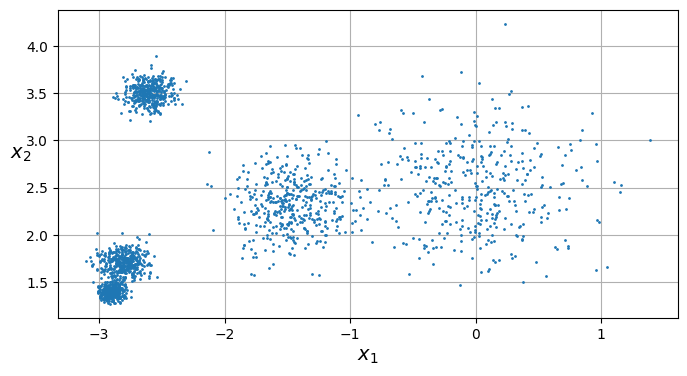

In [3]:
def plot_clusters(X, y=None):
    plt.scatter(X[:, 0], X[:, 1], c=y, s=1)
    plt.xlabel("$x_1$")
    plt.ylabel("$x_2$", rotation=0)

plt.figure(figsize=(8, 4))
plot_clusters(X)
plt.gca().set_axisbelow(True)
plt.grid()
plt.show()

Definimos $k=5$ y ejecutamos una única vez el agrupador K-Means.

Ajustamos el agrupador a los datos que tenemos y utilizamos las funciones proporcionadas para representar los centroides (utilizando $\textit{plot_centroids}$) y los bordes de decisión ($\textit{plot_decision_boundaries}$).

In [4]:
# Apartado 1
k = 5
kmeans = KMeans(random_state=42, n_clusters=k, n_init=1)

In [5]:
#Apartado 2
# Realiza una gráfica de los puntos pasados en X
def plot_data(X):
    plt.plot(X[:, 0], X[:, 1], 'k.', markersize=2)


def plot_centroids(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='o', s=35, linewidths=8,
                color=circle_color, zorder=10, alpha=0.9)
    plt.scatter(centroids[:, 0], centroids[:, 1],
                marker='x', s=2, linewidths=12,
                color=cross_color, zorder=11, alpha=1)

def plot_decision_boundaries(clusterer, X, resolution=1000, show_centroids=True,
                             show_xlabels=True, show_ylabels=True,
                             maxs = None):
    mins = X.min(axis=0) - 0.1

    if maxs is None:
      maxs = X.max(axis=0) + 0.1
    else:
      maxs = [maxs[0]+0.1, maxs[1]+0.1]

    xx, yy = np.meshgrid(np.linspace(mins[0], maxs[0], resolution),
                         np.linspace(mins[1], maxs[1], resolution))
    Z = clusterer.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    plt.contourf(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                cmap="Pastel2")
    plt.contour(Z, extent=(mins[0], maxs[0], mins[1], maxs[1]),
                linewidths=1, colors='k')
    plot_data(X)
    if show_centroids:
        plot_centroids(clusterer.cluster_centers_)

    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)


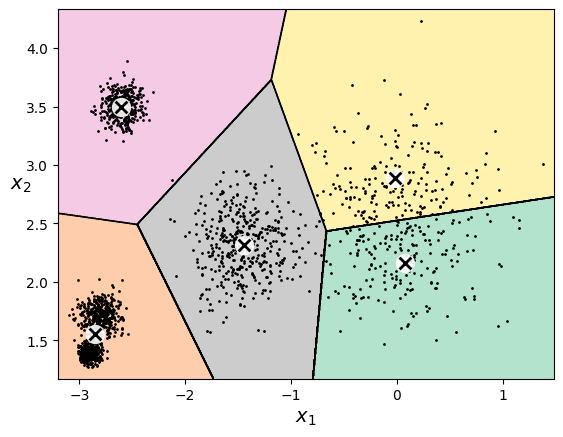

In [6]:
kmeans.fit(X)
plot_decision_boundaries(kmeans, X)

Como vemos, el clasificador se ha equivocado bastante, y únicamente ha acertado en la zona rosa y en la gris.

En la zona naranja, solo considera un cluster, mientras que gráficamente se observan 2 clusters.

En la zona amarilla y verde le ocurre lo contrario, considerando dos clusters, donde debería considerar solo uno.

Ahora intentaremos predecir tres nuevas instancias:

In [7]:
#Apartado 3
X_new = np.array([[0, 2], [3, 2], [-3, 3], [-3, 2.5]])

Utilizaremos primero un clustering duro, es decir, se nos dice KMedias nos dirá un único cluster al que pertenece esa instancia:

In [8]:
kmeans.predict(X_new)

array([0, 0, 2, 1], dtype=int32)

Para entender lo que significan estos valores, realizamos una nueva representación gráfica. En ella, representaremos qué valor (o label) le ha dado KMedias a cada cluster:

In [9]:
def plot_centroids_number(centroids, weights=None, circle_color='w', cross_color='k'):
    if weights is not None:
        centroids = centroids[weights > weights.max() / 10]

    plt.scatter(centroids[:, 0], centroids[:, 1],
            marker='o', s=190, linewidths=8,
            color=circle_color, zorder=10, alpha=0.9)

    for count, centroid in enumerate(centroids):
      plt.scatter(centroid[0], centroid[1], zorder=11, alpha=1,
                  marker=f'${count}$', s=300)

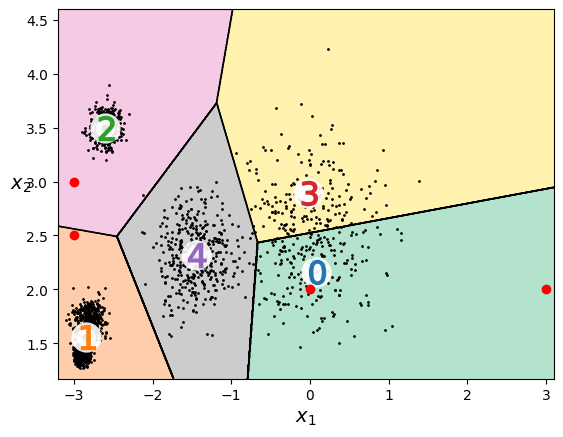

In [10]:
plot_centroids_number(kmeans.cluster_centers_)
plot_decision_boundaries(kmeans, X, show_centroids=False, maxs=[3,4.5])

plt.scatter(X_new[:,0], X_new[:,1], zorder=12, color= 'r')
plt.show()

Hemos representado en rojo las instancias nuevas a clasificar.

Tanto $[0,2]$ como $[3,2]$ son fácilmente clasificables en el cluster con etiqueta 0. Sin embargo, tanto $[-3,3]$, y especialmente $[-3,2.5]$ son más complicados de clasificar, ya que están muy cerca de los clusters con etiquetas 1 y 2.

Realizaremos ahora la predicción con clustering flexible, donde recuperaremos un valor de pertenencia a cada cluster. En concreto, cada valor será la distancia a los centroides, por lo que a menor valor, se supone que mayor será la probabilidad de pertenencia a dicho cluster:

In [11]:
kmeans.transform(X_new)

array([[0.18223039, 2.88604435, 3.00245465, 0.89138253, 1.48240029],
       [2.92625035, 5.86829444, 5.79854651, 3.14941474, 4.45922309],
       [3.18974087, 1.45428401, 0.63877213, 2.98127968, 1.69530934],
       [3.09660472, 0.95827092, 1.07572208, 3.00485781, 1.56275789]])

*   $[0,2]$ está muy cerca del centroide del cluster 0, aunque también está cerca del 3.
*   $[3,2]$ está muy lejos de todos los centroides, aunque está ligeramente más cerca del 0 y del 3.
*   $[-3,3]$ está bastante cerca de 1 y de 4, pero el centroide del que está más cerca es el 2.
*   Finalmente, observamos lo dicho anteriormente, $[-3,2.5]$ está prácticamente a la misma distancia de 1 y de 2.




Elegiremos ahora los centroides de manera manual. Elegimos como valores para los centroides aquellos con los que generamos los datos, y ajustamos de nuevo los datos.

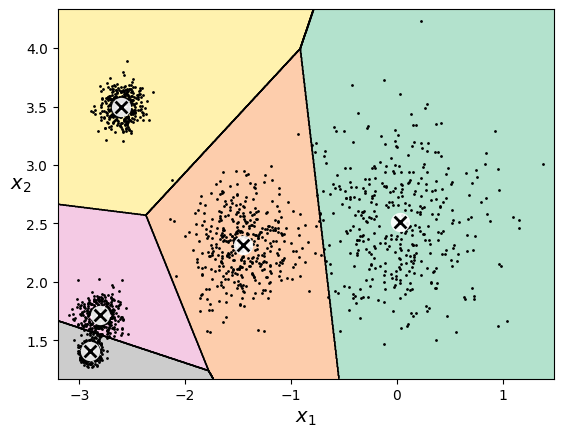

In [12]:
#Apartado 4
good_init = np.array([[ 0,  2.5], [-1.5 ,  2.3], [-2.8,  1.7], [-2.6,  3.5], [-2.9,  1.4]])
kmeans = KMeans(n_clusters = k, n_init = 1, init = good_init)
kmeans.fit(X)

# Representamos de nuevo los datos
plot_decision_boundaries(kmeans, X)

Tenemos ya 5 clusters que se ajustan más a lo que veíamos al realizar una gráfica de los datos.

Calculamos ahora cuál es la inercia del modelo obtenido (suma de las distancias al cuadrado entre las instancias y sus centroides más cercanos).

Por tanto, en general, a mayor valor, peor se ajusta el modelo a los datos, ya que las instancias están muy separadas de su centroide.

In [13]:
#Apartado 5
kmeans.inertia_

212.06148433504592

Calculamos el score que nos devuelve KMeans, que es la inercia cambiada de signo, consiguiendo así que un mayor valor indique un mejor ajuste del modelo a las instancias, como en las métricas de SkLearn ($\textit{neg_mean_absolute_error}$, $\textit{neg_mean_squared_error}$, ...) .

In [14]:
kmeans.score(X)

-212.06148433504592

Probaremos ahora los distintos parámetros de init (centroides iniciales) y algorithm (algoritmo para determinar los clusters).
- **Init**:
  - *k-means++* : Se elige el primer centroide aleatoriamente, y el resto se determinan intentando que estén bastante separados unos de otros.
  - *random*: se determinan aleatoriamente
  - *array*: los centroides iniciales son los que indica el array

- **Algorithm**:
  - *lloyd*: algoritmo básico de las k medias
  - *elkan*: k medias acelerado, intenta acelerar el cálculo cuando hay muchos clusters y muchos datos.

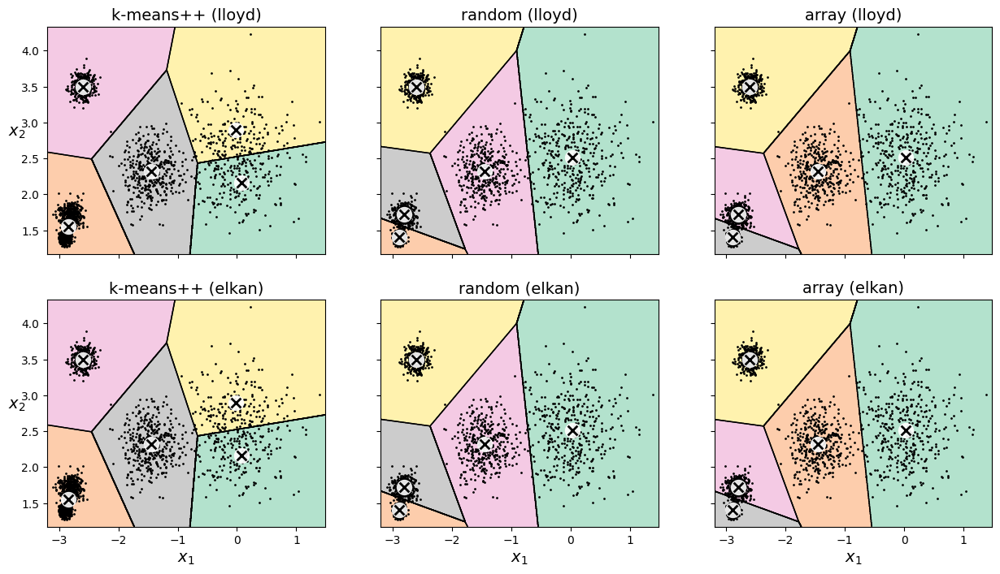

In [15]:
#Apartado 6
init = ['k-means++', 'random', good_init]
algorithm = ['lloyd', 'elkan']

f, axs = plt.subplots(len(algorithm), len(init), figsize=(15,8))

aux = 1

for parameter_algorithm in algorithm:
  for parameter_init in init:
    ax = plt.subplot(len(algorithm), len(init), aux)

    kmeans = KMeans(random_state=42, init=parameter_init, n_clusters=5, n_init=1, algorithm=parameter_algorithm)
    kmeans.fit(X)
    plot_decision_boundaries(kmeans, X)

    if parameter_init is good_init:
      alg = 'array'
    else:
      alg = parameter_init

    ax.set_title (f'{alg} ({parameter_algorithm})')

    aux += 1

for ax in axs.flat:
  ax.label_outer()

No se observan prácticamente diferencias entre utilizar $lloyd$ y $elkan$. Esto se debe a que al tener pocos clusters y pocos datos, los algoritmos serán prácticamente idénticos.

Tampoco se observan diferencias entre usar $random$ y el $array$ anterior llamado $\textit{good_init}$.

Solo se encuentran diferencias en la delimitación de los clusters de abajo a la izquierda y el cluster de la derecha. Dichas diferencias se observan entre usar $\textit{k-means++}$ y el resto de parámetros de $init$.

Resulta curioso que, en este caso, $\textit{k-means++}$ obtiene gráficamente peores resultados que inicializar los centroides aleatoriamente. Esto se debe a que, si solo nos fijamos en la inercia, obtiene la mejor solución:

In [16]:
kmeans = KMeans(random_state=42, init='k-means++', n_clusters=5, n_init=1)
kmeans.fit(X)
print(f'Inercia con k-means++ = {kmeans.inertia_}')

kmeans = KMeans(random_state=42, init='random', n_clusters=5, n_init=1)
kmeans.fit(X)
print(f'Inercia con random = {kmeans.inertia_}')

Inercia con k-means++ = 182.42743171912477
Inercia con random = 212.05827170202267


Al situar los centroides muy separados, consigue encontrar esa solución, y como la inercia es mejor que la de la solución que buscamos, no consigue encontrar la solución ideal.

Esto se debe a que los puntos del cluster de abajo a la izquierda están muy juntos y los del cluster a la derecha están muy separados, y por tanto, la inercia, que intenta minimizar la distancia al centroide, resulta algo engañosa.

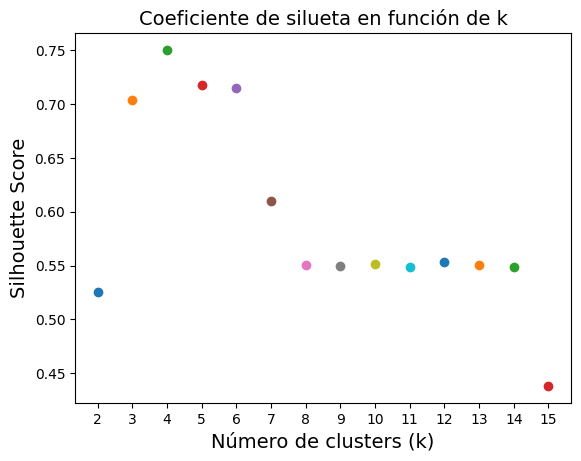

In [17]:
#Apartado 7
from sklearn.metrics import silhouette_score

num_clusters = list(range(2,16))
plt.xticks(num_clusters)
plt.xlabel("Número de clusters (k)")
plt.ylabel("Silhouette Score")
plt.title("Coeficiente de silueta en función de k")

for clusters in num_clusters:
  kmeans = KMeans(random_state=42, n_clusters = clusters, n_init=10)
  kmeans.fit(X)
  labels_predict = kmeans.predict(X)
  silhouette = silhouette_score(X, labels_predict)

  plt.scatter(clusters, silhouette)

El coeficiente de silueta puede variar (explicado en las transparencias) entre -1 y 1, siendo 1 el mejor valor.

Aquí se observa que el mejor valor se obtiene para $k=4$, seguido de $k=5$. Tanto para $k=2$, como para $k \geq 7$ se obtienen resultados mucho peores.

Este coeficiente nos indica que, en el caso $k=4$, hay más instancias que están bien dentro de su cluster y lejos de otros clústeres.

Parece que en $k=5$, a pesar de ser el valor correcto, la separación que se produce en los dos clústeres de abajo a la izquierda (en el caso de init='random') o en la del clúster de la derecha (en el caso de k-means++) provoca que haya muchas instancias cerca del límite de un cluster, lo cual decrementa ligeramente el coeficiente.



In [18]:
#Apartado 8
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter

#A CUBRIR POR EL ALUMNADO

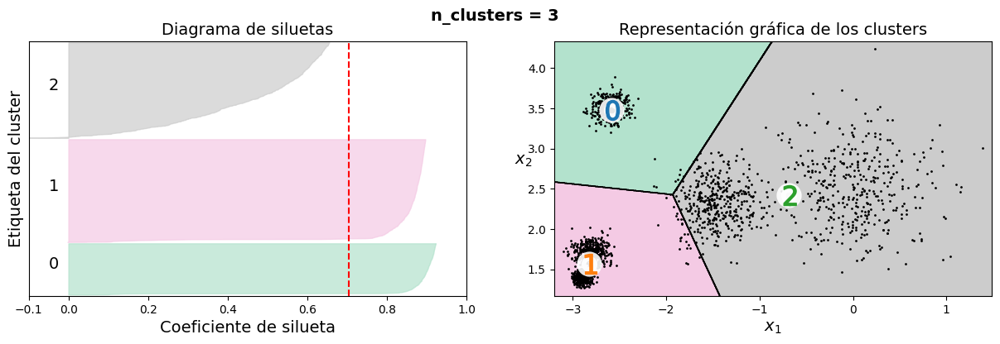

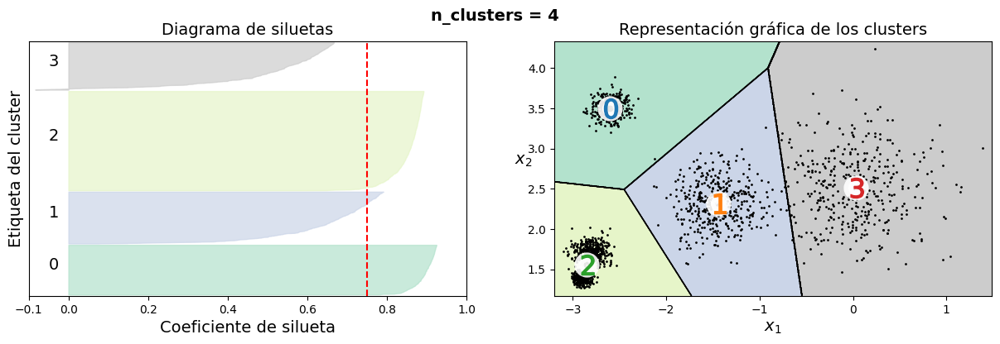

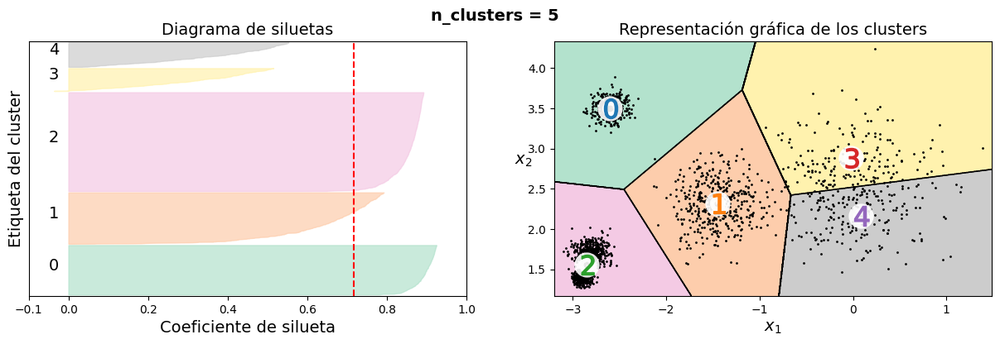

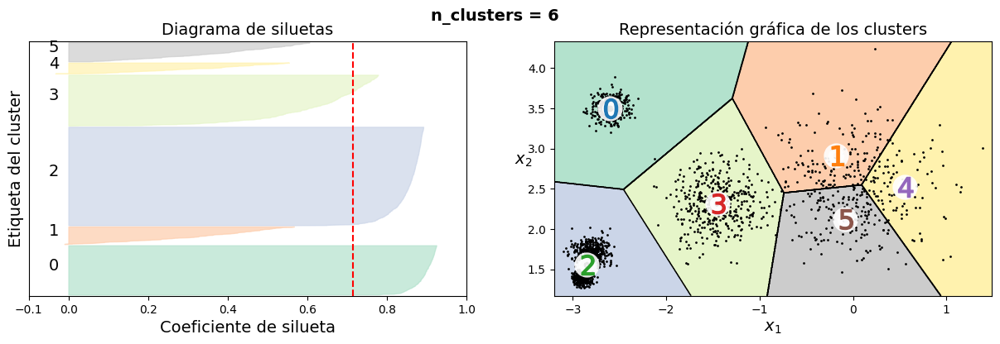

In [19]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples

range_n_clusters = [3, 4, 5, 6]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,4))

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init=10, random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    #print(
    #    "For n_clusters =",
    #    n_clusters,
    #    "The average silhouette_score is :",
    #    silhouette_avg,
    #)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Pastel2(int(float(len(cm.Pastel2.colors)-1) / (n_clusters-1) * i))
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            color = color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de siluetas")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Etiqueta del cluster")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    ax2.set_title(f'Representación gráfica de los clusters')
    ax2.set_xlabel(f'$x_1$')
    ax2.set_ylabel(f'$x_2$')

    plot_centroids_number(clusterer.cluster_centers_)
    plot_decision_boundaries(clusterer, X, show_centroids=False)

    plt.suptitle(
        "n_clusters = %d"
        % n_clusters,
        fontsize=14,
        fontweight="bold",
    )

plt.show()

Para $\textit{n_clusters} = 3$, tanto en el cluster 0 como en el 1, los puntos están bastante bien clasificados, obteniendo un coeficiente mayor que 0.8 en prácticamente todos los puntos. En el cluster 2, sin embargo, hay muchos puntos que obtienen un diagrama de silueta cercano a 0, es decir, que están muy cerca de la frontera de los otros dos clusters.

Para $\textit{n_clusters} = 4$, el cluster que en el caso anterior era el 2, se divide en 2 clusters, lo que permite mejorar el coeficiente de silueta en dichos puntos, manteniendo los buenos resultados en los otros dos clusters. A pesar de ello, el cluster número 3 sigue obteniendo resultados peores a los otros clusters.

Para $\textit{n_clusters} = 5$, se divide el cluster 3 anterior en dos clusters (3 y 4), pero el resultado en este caso empeora. Los resultados en el resto de clusters se mantienen, pero los puntos de los dos nuevos clusters obtienen coeficientes de silueta por debajo de 0.5, lo que indica que están muy cerca de la frontera, y podrían estar clasificándose mal.

La situación se lleva al extremo en el caso $\textit{n_clusters} = 6$, se crea un nuevo cluster a la derecha, pero de nuevo se obtienen muchos puntos con coeficientes inferiores a 0.5, por estar muy cerca de la frontera los puntos de los clusters 1,4 y 5.

Importamos el dataset de las caras de *olivetti*:

In [20]:
#Apartado 9

data = 'drive/MyDrive/Colab Notebooks'

from sklearn.datasets import fetch_olivetti_faces
olivetti = fetch_olivetti_faces()

from sklearn.model_selection import StratifiedShuffleSplit

#A CUBRIR POR EL ALUMNADO

def plot_faces(faces, labels, n_cols=5):
    faces = faces.reshape(-1, 64, 64)
    n_rows = (len(faces) - 1) // n_cols + 1
    plt.figure(figsize=(n_cols, n_rows * 1.1))
    for index, (face, label) in enumerate(zip(faces, labels)):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(face, cmap="gray")
        plt.axis("off")
        plt.title(label)
    plt.show()

#A CUBRIR POR EL ALUMNADO

downloading Olivetti faces from https://ndownloader.figshare.com/files/5976027 to /root/scikit_learn_data


Realizamos un muestreo estratificado, para tener  especificando el tamaño del test como el 20% de los ejemplos y reservando el 80% para el entrenamiento, como es usual:

In [21]:
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42)

for train_index, test_index in sss.split(olivetti.data, olivetti.target):
    x_train = olivetti.data[train_index]
    y_train = olivetti.target[train_index]

    x_test = olivetti.data[test_index]
    y_test = olivetti.target[test_index]

Reducción de dimensionalidad:

In [22]:
from sklearn.decomposition import PCA
pca = PCA(0.95,random_state=42)

x_train_reduced = pca.fit_transform(x_train)

Determinaremos primero el número de clusters a utilizar.

Calculamos primero el coeficiente de silueta para varios valores para el número de clusters.

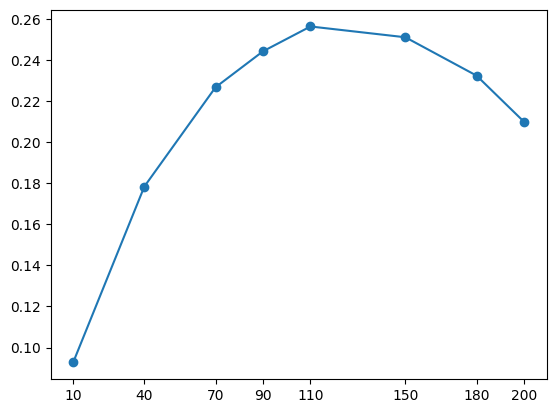

In [23]:
from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

n_clusters = [10, 40, 70, 90, 110, 150, 180, 200]
silhouette = []
inertia = []

for clusters in n_clusters:
  kmeans = KMeans(n_init=10, n_clusters = clusters, random_state=42)
  kmeans.fit(x_train_reduced)

  inertia.append(kmeans.inertia_)
  cluster_labels = kmeans.predict(x_train_reduced)
  silhouette_avg = silhouette_score(x_train_reduced, cluster_labels)

  silhouette.append(silhouette_avg)

plt.xticks(n_clusters)
plt.scatter(n_clusters, silhouette)
plt.plot(n_clusters, silhouette)
plt.show()

El mejor valor resulta ser $\textit{n_clusters} = 110$, que resulta ser un número muy elevado para la poca cantidad de datos que tenemos en el conjunto de entrenamiento, que no llega a los 400.

A pesar de ser el mejor valor, el coeficiente de silueta que se obtiene es muy reducido, ni siquiera llegando a 0.3. Es decir, muchas instancias están muy cerca de la frontera de otros clusters, e indica que hay solapamiento de los clusters.

Analizamos también la inercia de los modelos en función del número de clusters:

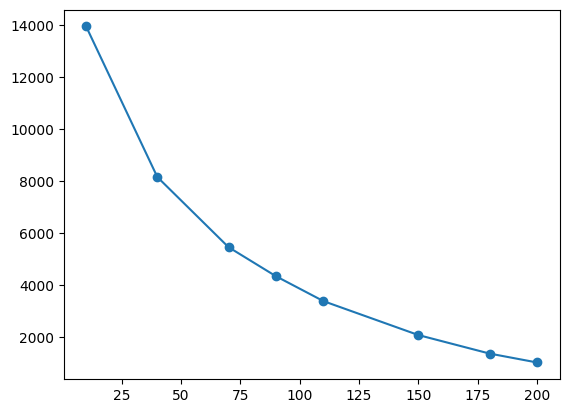

In [24]:
plt.scatter(n_clusters, inertia)
plt.plot(n_clusters, inertia)
plt.show()

No se observa un codo muy marcado, pero es cierto que a partir de $\textit{n_clusters} = 110$ y de $\textit{n_clusters} = 150$, el crecimiento es prácticamente lineal, por lo que serían los valores que deberíamos elegir.

Trabajaremos a partir de aquí, por tanto, con $\textit{n_clusters} = 110$.

In [25]:
parametros = [dict(n_init = 10), dict(init='random', n_init=1), dict(init='random', n_init=10, algorithm='elkan')]

In [26]:
from sklearn.cluster import KMeans

n_clusters = 110

modelos = []
silueta_train = []
inercia_train = []

for i,parametro in enumerate(parametros):
  modelos.append(KMeans(**parametro, n_clusters=n_clusters, random_state=42))

for modelo in modelos:
  modelo.fit(x_train_reduced)


Comparamos finalmente los tres modelos, calculando su inercia y su puntuación de silueta.

In [27]:
for modelo in modelos:
  inercia_train.append(modelo.inertia_)

  cluster_labels = modelo.predict(x_train_reduced)
  silhouette_avg = silhouette_score(x_train_reduced, cluster_labels)

  silueta_train.append(silhouette_avg)

from tabulate import tabulate
tabla = []

for i, modelo in enumerate(modelos):
  fila = []
  fila.append(modelo)
  fila.append(inercia_train[i])
  fila.append(silueta_train[i])

  tabla.append(fila)

print(tabulate(tabla,
               headers=['Modelo', 'Inercia', 'Puntuación de silueta'],
               tablefmt='fancy_grid',
               numalign='right'))

╒═════════════════════════════════════════════════════════════════════╤═══════════╤═════════════════════════╕
│ Modelo                                                              │   Inercia │   Puntuación de silueta │
╞═════════════════════════════════════════════════════════════════════╪═══════════╪═════════════════════════╡
│ KMeans(n_clusters=110, n_init=10, random_state=42)                  │   3373.72 │                0.256332 │
├─────────────────────────────────────────────────────────────────────┼───────────┼─────────────────────────┤
│ KMeans(init='random', n_clusters=110, n_init=1, random_state=42)    │   4452.98 │                0.161003 │
├─────────────────────────────────────────────────────────────────────┼───────────┼─────────────────────────┤
│ KMeans(algorithm='elkan', init='random', n_clusters=110, n_init=10, │    4128.6 │                0.179576 │
│        random_state=42)                                             │           │                         │
╘═════════

Obtenemos que, el modelo teóricamente mejor, que sería $\textit{k-means++}$ es el que obtiene los mejores resultados, ya que obtiene menor inercia y mayor puntuación de silueta.

Aun así, los resultados que se obtienen no son muy buenos, ya que la inercia es bastante elevada (para ser valores entre 0 y 1), y la puntuación de silueta no llega ni a superar 0.3, lo cual indica que la clasificación que se está realizando no es muy buena.

Obviamente, el modelo con inicio aleatorio mejora al realizar un mayor número de ejecuciones.



Veamos gráficamente cómo se comporta el mejor de los modelos obtenidos:

Para ello, ordenamos las imágenes por la predicción realizada por el modelo:

In [28]:
import numpy as np

kmeans = modelos[0]
predict_labels = kmeans.predict(x_train_reduced)

dtype = [('data', 'object'), ('predict_label', int), ('real_label', int), ('id', int)]
images_label = []
sklearn.cluster.KMeans
for i,image in enumerate(x_train):
  images_label.append((image, predict_labels[i], y_train[i], i))

images_label = np.array(images_label, dtype=dtype)

In [29]:
images_label = np.sort(images_label, order = ['predict_label', 'id'])

def plot_clusters_faces(faces, predict_labels, real_labels, n_cols=5):
    faces = faces.reshape(-1, 64, 64)
    n_rows = (len(faces) - 1) // n_cols + 1
    plt.figure(figsize=(n_cols * 1.2, n_rows * 1.3))
    for index, (face, predict_label, real_label) in enumerate(zip(faces, predict_labels, real_labels)):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(face, cmap="gray")
        plt.axis("off")
        plt.title(f'{predict_label} :: {real_label}')
    plt.show()

Representamos las distintas imágenes. Encima de cada imagen, se escribirá:

> Etiqueta predicha por el modelo :: Número de individuo real fotografiado

Si en un determinado cluster, el número de individuo real fotografiado es el mismo casi siempre, querrá decir que las caras que pertenecen al cluster son muy similares entre ellas.

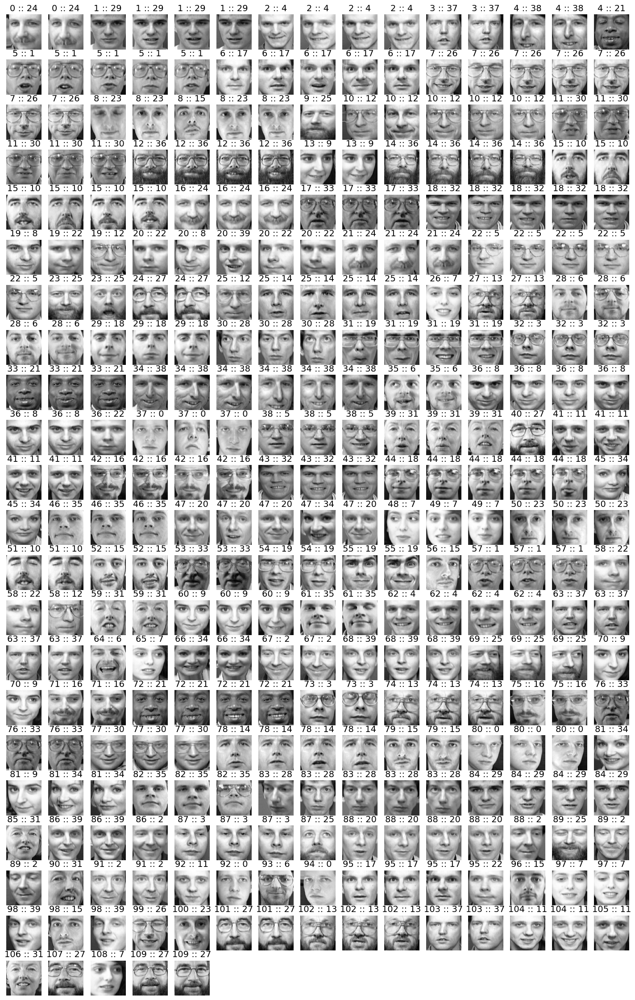

In [30]:
data = np.array([x for x in images_label['data']], dtype=np.float32)
plot_clusters_faces(data,images_label['predict_label'], images_label['real_label'], n_cols = 15)

Observamos que en cada cluster, hay caras muy similares y en la mayoría de casos son del mismo individuo, especialmente si dicha persona tiene rasgos muy distinguidos, como gafas, barba, dientes irregulares, etc.

Pero al elegir un número tan grande de clusters (siendo el valor real 40), el modelo clasifica como distintas muchas caras que pertenecen a la misma persona.

Fijémonos, por ejemplo en el individuo 36, que nuestro modelo clasifica perfectamente en el cluster 12. Pero se deja imágenes muy similares que las introduce todas en el cluster 14, cuando las similitudes con las imágenes que ha clasificado como 12 son enormes.

Podemos ver cuán útiles son los clusters que hemos obtenido:

In [31]:
n_clusters_01 = 0
n_clusters_2 = 0
n_clusters_different = 0

for cluster_id in np.unique(kmeans.labels_):
  index_cluster = kmeans.labels_ == cluster_id
  faces = x_train[index_cluster]
  labels = y_train[index_cluster]

  if (len(faces) <= 1):
    n_clusters_01 += 1
  elif (len(np.unique(labels)) == 1):
    n_clusters_2 += 1
  else:
    n_clusters_different += 1

print(f'Clusters con menos de 2 imágenes: {n_clusters_01}')
print(f'Clusters con al menos 2 imágenes, todas del mismo individuo: {n_clusters_2}')
print(f'Clusters con imágenes de varios individuos: {n_clusters_different}')


Clusters con menos de 2 imágenes: 18
Clusters con al menos 2 imágenes, todas del mismo individuo: 76
Clusters con imágenes de varios individuos: 16


Es decir, de los 110 clusters que tenemos, 34 de ellos (~30%) o tienen menos de 2 imágenes o tienen imágenes de varios individuos, por lo que solo resultan verdaderamente útiles los 76 clusters restantes.

Pasamos finalmente a probar el modelo con el conjunto de test:

In [32]:
x_test_reduced = pca.transform(x_test)

In [33]:
inercia_test = []
silueta_test = []

inercia_test.append(-kmeans.score(x_test_reduced))

cluster_labels = modelo.predict(x_test_reduced)
silhouette_avg = silhouette_score(x_test_reduced, cluster_labels)

silueta_test.append(silhouette_avg)

from tabulate import tabulate
tabla = []


fila = []
fila.append(kmeans)
fila.append(inercia_test[0])
fila.append(silueta_test[0])

tabla.append(fila)

print(tabulate(tabla,
               headers=['Modelo', 'Inercia', 'Puntuación de silueta'],
               tablefmt='fancy_grid',
               numalign='right'))

╒════════════════════════════════════════════════════╤═══════════╤═════════════════════════╕
│ Modelo                                             │   Inercia │   Puntuación de silueta │
╞════════════════════════════════════════════════════╪═══════════╪═════════════════════════╡
│ KMeans(n_clusters=110, n_init=10, random_state=42) │   1710.39 │               0.0997435 │
╘════════════════════════════════════════════════════╧═══════════╧═════════════════════════╛


Vemos que la inercia no es muy elevada, pero la puntuación de silueta es prácticamente 0, es decir, muchos valores se encuentran en la frontera, y como se ha visto antes, los clusters están solapados. Realicemos la representación anterior para el test:

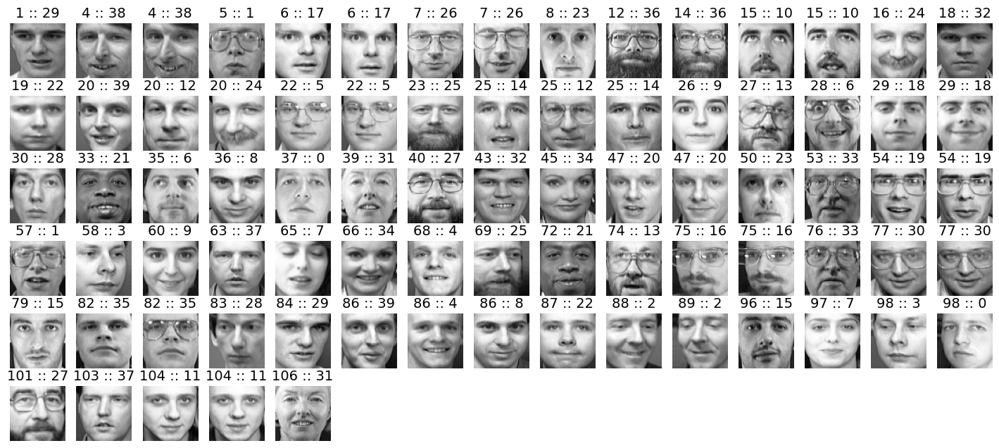

In [34]:
kmeans = modelos[0]
predict_labels = kmeans.predict(x_test_reduced)

dtype = [('data', 'object'), ('predict_label', int), ('real_label', int), ('id', int)]
images_label = []

for i,image in enumerate(x_test):
  images_label.append((image, predict_labels[i], y_test[i], i))

images_label = np.array(images_label, dtype=dtype)
images_label = np.sort(images_label, order = ['predict_label', 'id'])

data = np.array([x for x in images_label['data']], dtype=np.float32)
plot_clusters_faces(data,images_label['predict_label'], images_label['real_label'], n_cols = 15)

Vuelve a ocurrir algo similar al entrenamiento. En general, las caras dentro de un mismo cluster son muy similares, y en muchas ocasiones son del mismo individuo. Sin embargo, debido a haber tantos clusters y ser las imágenes de un mismo individuo tan diferentes entre sí (véase por ejemplo, el individuo número 6, clasificado en una ocasión en el cluster 28 y en la otra en el 35), caras que pertenecen al mismo individuo son clasificadas la mayoría de veces en distintos clusters.

El modelo, en general, es bastante impreciso.

Aunque podíamos esperar que el número de clusters que íbamos a obtener fuera cercano a 40 (número de personas fotografiadas), hemos comprobado que las fotografías de una misma persona son muy distintas entre ellas (con o sin gafas, sonriendo o serio, etc.). Esto último acaba provocando que el número de clusters óptimo obtenido sea mayor de 100.

De ahí que muchos clusters no tengan prácticamente utilidad, algunos llegan a contener una única imagen, y la gran mayoría contienen dos o tres imágenes, que en algunos casos son de personas distintas.

### <font color='blue'>Ejercicio 1.B: Utilización de DBSCAN (1 punto)</font>

<font color='blue'> En este ejercicio haremos algo similar a lo realizado en el anterior, pero ahora con otro problema sintético en 2D y el algoritmo DBSCAN. Para crear el conjunto sintético haremos uso de la función `make_moons` dentro del paquete de `sklearn.datasets`. Crearemos un conjunto sintético de $1.000$ puntos con una tasa de ruido de $0.05$.


<font color='blue'> Las tareas a realizar a realizar en este ejercicio se resumen a continuación:
1. A partir del conjunto de datos especificado, ajusta un algoritmo DBSCAN con los hiperparámetros por defecto (5 mínimas muestras por cluster). Identifica los índices de los ejemplos núcleo (_core points_)) e imprime sus coordenadas. Para ello, emplea las variables de instancia `core_sample_indices_` y `components_`, respectivamente.
2. La variable de instancia `labels_` contiene el núcleo al que pertenece cada ejemplo
del conjunto de datos. Observa que algunas instancias tienen un índice de cluster
igual a -1, lo que significa que el algoritmo las considera anomalías. En un conjunto
sencillo como este, en un principio, no debería haber anomalías. El hiperparámetro `eps` indica la distancia
máxima entre dos muestras para que una se considere vecina de la otra (no se trata de un
límite máximo de las distancias de los puntos dentro de un cluster). Es el hiperparámetro
de DBSCAN más importante que debes elegir adecuadamente para tu conjunto de datos y
función de distancia. Ajusta 4 modelos de DBSCAN con el hiperparámetro $eps$ igual a
$\{0.01,0.02,0.05,0.1\}$. Dibuja una representación de los clústers para cada modelo
identificando las anomalías que tiene en el gráfico y dando el porcentaje de anomalías
de cada modelo. Analiza y explica los resultados obtenidos.
3. Sorprendentemente, la clase DBSCAN no tiene un método `predict()`,
aunque sí tiene un método `fit_predict()`. En otras palabras, no puede predecir
a qué cluster pertenece una nueva instancia. Esta decisión se tomó porque diferentes
algoritmos de clasificación pueden ser mejores para diferentes tareas, por lo que los
autores decidieron dejar que el usuario eligiera cuál utilizar. Pero sí se puede usar
un clasificador para ver en qué cluster está cada punto nuevo. Hazlo con un clasificador
kNN con un vecindario de 30 vecinos, usando el mejor modelo del apartado anterior y utilizando como
ejemplos de entrenamiento los _core points_ encontrados y como etiquetas (salidas deseadas) las `labels_` obtenidas. Obtén el cluster asociado y la probabilidad para los
siguientes 4 ejemplos `[[-0.5, 0], [0, 0.5], [1, -0.1], [2, 1]]`.
Junto con lo anterior, dibuja un gráfico que represente los bordes de decisión y aplica también k-means sobre los mismo datos. Analiza las diferencias entre dichas fronteras de decisión en base al funcionamiento y naturaleza de los dos algoritmos subyacentes.
    
<font color='blue'> El alumnado debe describir en detalle el trabajo realizado y las conclusiones extraídas.



---



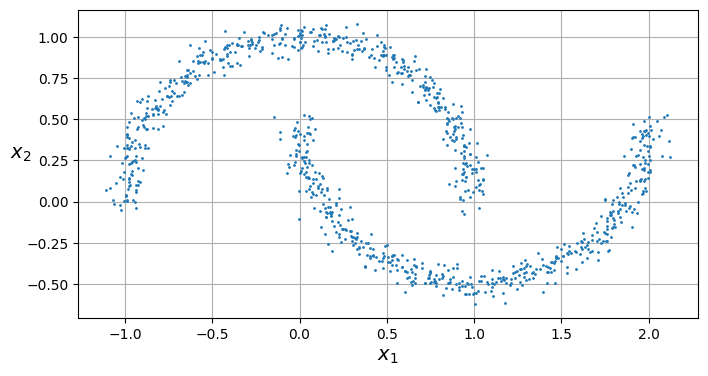

In [35]:
#Apartado 1
from sklearn.cluster import DBSCAN
from sklearn.datasets import make_moons

X, y = make_moons(n_samples=1000, noise=0.05, random_state=42)

#A CUBRIR POR EL ALUMNADO

plt.figure(figsize=(8, 4))
plot_clusters(X)
plt.gca().set_axisbelow(True)
plt.grid()
plt.show()

In [36]:
def plot_dbscan(dbscan, X, size, show_xlabels=True, show_ylabels=True, show_legend=False):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ == -1
    non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    non_cores = X[non_core_mask]

    anom_rate = len(anomalies) / len(X) * 100

    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    scatter = plt.scatter(cores[:, 0], cores[:, 1], marker='*', s=20, c=dbscan.labels_[core_mask])

    if show_legend:
      plt.legend(*scatter.legend_elements())

    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="r", marker="x", s=100)
    plt.scatter(non_cores[:, 0], non_cores[:, 1],
                c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$")
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title(f"eps={dbscan.eps:.2f}, min_samples={dbscan.min_samples}, anom={anom_rate}%")
    plt.grid()
    plt.gca().set_axisbelow(True)

Representamos utilizando la función anterior los ejemplos núcleo:

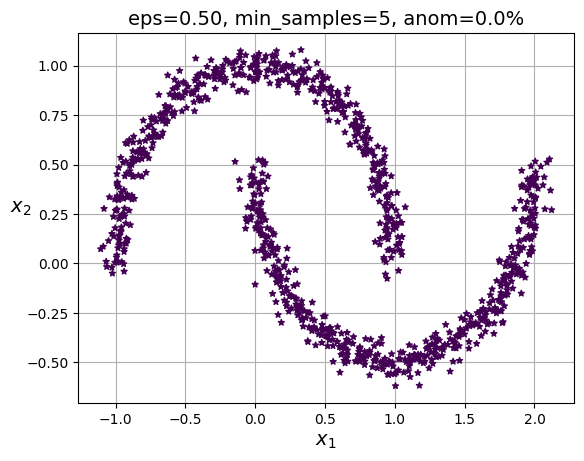

In [37]:
dbscan = DBSCAN()
dbscan.fit(X)

plot_dbscan(dbscan, X, 5)

Se están clasificando todas las instancias como de un mismo cluster. Esto parece que se debe al valor tan grande que hemos elegido para el hiperparámetro $eps$. Todas las instancias de la luna de abajo tienen una instancia de la luna de arriba a menor distancia de 0.5.

Veamos si es así ahora. Representamos con una cruz roja las anomalías detectadas, y representamos cada cluster con un color distinto (los núcleos con una estrella, y el resto con un punto):

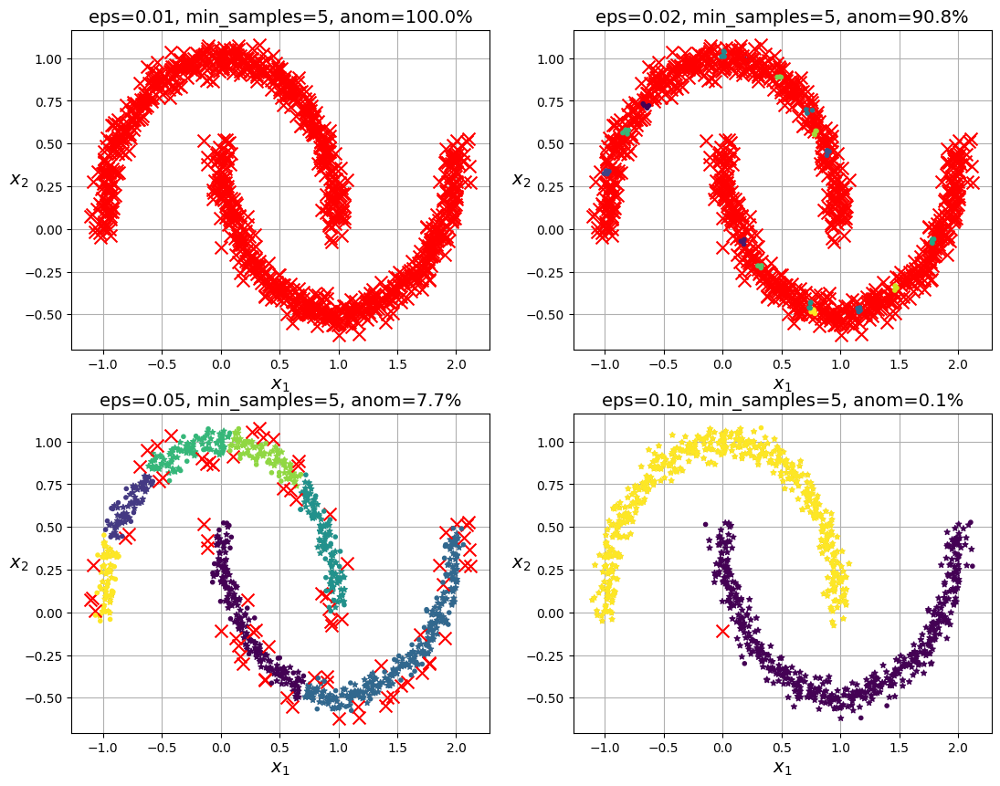

In [38]:
# Apartado 2
eps = [0.01, 0.02, 0.05, 0.1]

plt.figure(figsize=(13, 10))

for i,epsilon in enumerate(eps):
  plt.subplot(2, int(len(eps)/2), i+1)

  dbscan = DBSCAN (eps=epsilon)
  dbscan.fit(X)

  plot_dbscan(dbscan, X, 5)

Cuando el valor de $eps$ es es $0.01$ y $0.02$ DBSCAN considera que prácticamente todos los puntos son anomalías, lo cual no tiene ningún sentido.

El modelo mejora algo con $eps = 0.05$, pero aun así sigue considerando demasiadas anomalías para ser un conjunto de datos tan pequeño. Además, el modelo obtiene 7 clusters, cuando gráficamente está claro que solo hay dos.

Con $eps = 0.1$ el modelo se ajusta mucho a la intuición que teníamos: dos clusters diferenciados (la luna de arriba y la de abajo), y prácticamente ninguna anomalía.

Elegimos este último modelo, y representamos cuál es la etiqueta de cada cluster:

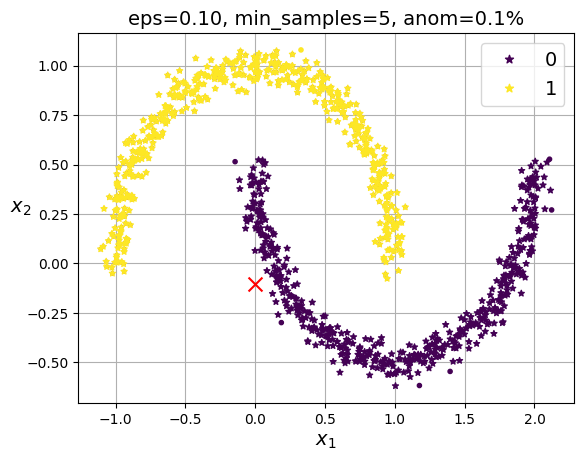

In [39]:
#Apartado 3
from sklearn.neighbors import KNeighborsClassifier

best_model = DBSCAN(eps=0.1)
best_model.fit(X)

plot_dbscan(best_model, X, 5, show_legend=True)

Para predecir nuevos valores, entrenamos un modelo kNN con k=30, con los núcleos y etiquetas obtenidas por DBSCAN:

In [40]:
core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
core_mask[dbscan.core_sample_indices_] = True

y_train = dbscan.labels_[core_mask]
x_train = dbscan.components_

k = 30
knn = KNeighborsClassifier(n_neighbors = k)
knn.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=30)

Realizamos una predicción de tres nuevas instancias:

In [41]:
x_new = np.array([[-0.5,0],[0,0.5],[1,-0.1],[2,1]])
knn.predict(x_new)

array([1, 0, 1, 0])

Es decir, la primera y tercera instancia las clasifica en el cluster de arriba, y la segunda y la cuarta las clasifica en el cluster de abajo.

Mirando la gráfica, parece que los cuatro ejemplos están muy cerca de ambos clusters.

Calculamos ahora la probabilidad de pertenecer a cada cluster:

In [42]:
knn.predict_proba(x_new)

array([[0.1, 0.9],
       [1. , 0. ],
       [0. , 1. ],
       [1. , 0. ]])

Es decir, para el clasificador, la probabilidad de que estas instancias pertenezcan al otro cluster es prácticamente nula en los cuatro casos.

Representamos finalmente los bordes de decisión:

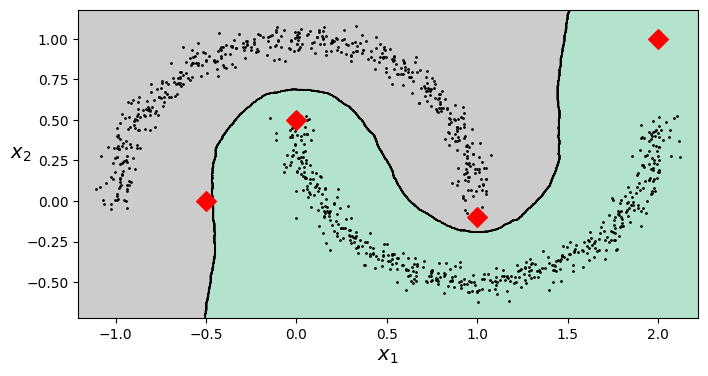

In [43]:
plt.figure(figsize = (8, 4))
plot_decision_boundaries(knn,X, show_centroids = False)
plt.scatter(x_new[:,0], x_new[:,1], c = 'r', marker = 'D', s=100, zorder = 15)
plt.show()

Aplicamos ahora un k medias con $k=2$ (ya que gráficamente observamos 2 clusters) y comparamos las fronteras de decisión obtenidas:

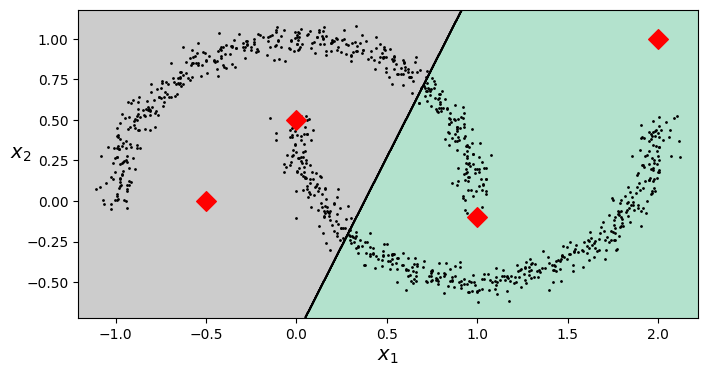

In [44]:
kmeans = KMeans(n_clusters = 2, random_state=42, n_init = 10)
kmeans.fit(X)

plt.figure(figsize = (8, 4))
plot_decision_boundaries(kmeans,X, show_centroids = False)
plt.scatter(x_new[:,0], x_new[:,1], c = 'r', marker = 'D', s=100, zorder = 15)
plt.show()

Comprobamos, como esperábamos, lo mal que funciona k-means cuando los clusters no tienen formas esféricas.

k-means agrupa en cada cluster parte de la luna de arriba y parte de la luna de abajo, mientras que DBSCAN consigue separar perfectamente los dos clusters.

## <font color='blue'>Ejercicio 2: PROBLEMA DE AGRUPAMIENTO (5 puntos)</font>

<font color='blue'> Para la realización de este ejercicio, se ha seleccionado el dataset denominado "Anuran Calls (MFCCs)" [1] (https://archive.ics.uci.edu/dataset/406/anuran+calls+mfccs). Este conjunto de datos describe las características sonoras de los cantos de diferentes especies de anfibios del orden Anura, cuyos integrantes coloquialmente son conocidos como ranas o sapos.

<font color='blue'> Se encuentran representados por medio de los coeficientes cepstrales en las frecuencias de Mel ([_Mel-frequency cepstral coefficients_](https://en.wikipedia.org/wiki/Mel-frequency_cepstrum), MFCCs), que son en esencia, una representación abstracta de una señal de audio obtenida al aplicar una transformada del coseno discreta a un espectrograma de Mel, es decir, una representación  de las frecuencias auditivas que son capaces de captar los humanos. Debido a ser una representación compacta del [espectrograma](https://en.wikipedia.org/wiki/Spectrogram), manteniendo las características más importantes del audio, se utiliza de forma regular en procesado del habla y aplicaciones de aprendizaje automático en procesado de señales de audio [2].

<font color='blue'> El dataset, creado por investigadores de la Universidad Federal del Amazonas en Brasil, contiene individuos de 10 especies, también incluyéndose su género y familia taxonómica, con el objetivo original de lograr realizar una clasificación multiclase de las especies de anuros que fueron grabados en los terrenos de la Universidad, así como de Mata atlántica (Brasil) y Córdoba (Argentina) en condiciones reales, es decir, con ruido de fondo.
    
<font color='blue'> Este conjunto de datos se utilizó en varias tareas de clasificación relacionadas con el reto del reconocimiento de especies de anuros a través de sus llamadas. Se trata de un conjunto de datos multietiqueta con tres columnas de etiquetas. Este conjunto de datos se creó segmentando 60 registros de audio pertenecientes a 4 familias diferentes, 8 géneros y 10 especies. Cada audio corresponde a un espécimen (una rana individual), el ID del registro también se incluye como columna adicional. Se utilizaron la entropía espectral y un método de cluster binario para detectar los fragmentos de audio pertenecientes a cada sonido. La segmentación y la extracción de características se realizaron en Matlab. Tras la segmentación se obtuvieron 7195 sílabas, que se convirtieron en instancias para entrenar y probar el clasificador.

<font color='blue'> Resulta entonces interesante saber si las clasificaciones taxonómicas realizadas tienen sentido en cuanto a los datos, es decir, ¿realmente se corresponden de cierta forma los distintos cantos de los anuros con la clasificación que poseen actualmente? ¿O existen especies que, siendo de diferentes grupos taxonómicos, poseen un canto indistinguible?

### <font color='blue'> Objetivos
    
<font color='blue'> El objetivo del presente trabajo es analizar los patrones de los datos, sin tomar en cuenta su _ground truth_, para determinar si la clasificación taxonómica actual corresponde razonablemente con una diferencia en los cantos. Claro está que este estudio representará un análisis superficial del problema, pero al menos sí podrá servir de base para estudiar si podemos determinar una taxonomía aproximada de los anuros.

<font color='blue'> Para llevar a cabo este objetivo principal se llevarán a cabo los siguientes objetivos secundarios:
1. <font color='blue'> Realización de un análisis exploratorio de los datos para una primera observación de las distribuciones de los cantos.
2. Detección y eliminación de _outliers_ así como las transformaciones necesarias para que los datos sean lo más "correctos" para los métodos de _clustering_.
4. Experimentación y determinación de los algoritmos y métricas intrínsecas más acordes a los datos. El alumnado debe experimentar con, al menos, dos algoritmos diferentes de _clustering_.

### <font color='blue'> Hipótesis
<font color='blue'>Sobre los datos se pueden realizar las siguientes hipótesis:
- <font color='blue'>Los datos, siendo grabaciones que incluyen el ruido de fondo, poseerán una cantidad significativa de _outliers_.
- <font color='blue'>Será posible, al menos en parte, observar cierta "agrupación" en los datos a simple vista.
- <font color='blue'>Existirá cierta correlación entre los _MFCCs_ debido a que provienen de una misma grabación, por lo que ciertas columnas/características crecerán o disminuirán de forma conjunta. En otras palabras, como el dispositivo empleado para adquirir sonidos es el mismo para todas las pistas de audio (7195), es razonable pensar que si algún _MFCC_ presenta algún problema, o atenuación de algún tipo, dicha particularidad podrá estar presente en todas las instancias/observaciones.  

### <font color='blue'> Resultados Esperados
<font color='blue'> Se espera que los resultados que se obtengan del clustering sean razonablemente parecidos a la realidad. Es decir, se espera que el agrupamiento encontrado tenga algún tipo de relación con alguna de las últimas 4 columnas de los datos (_Family_, _Genus_, _Species_ o _RecordID_).

### <font color='blue'> Bibliografía

<font color='blue'><font color='blue'>[1] E. N. Juan Colonna, “Anuran Calls (MFCCs).” UCI Machine Learning Repository, 2015. doi: 10.24432/C5CC9H. https://archive.ics.uci.edu/dataset/406/anuran+calls+mfccs

<font color='blue'>[2] “3.8. The cepstrum, mel-cepstrum and mel-frequency cepstral coefficients (MFCCs) — Introduction to Speech Processing.” Accessed: Jan. 13, 2024. [Online]. Available: https://speechprocessingbook.aalto.fi/Representations/Melcepstrum.html#the-cepstrum




In [45]:
#Para acceder a nuestros ficheros de Google Drive
from google.colab import drive
drive.mount('/content/drive')
# La carpeta 'clasificacion' (que contiene optdigits.tes, optdigits.tra, optdigits.names)
# debe estar en vuestro Drive, dentro de la carpeta 'Colab Notebooks'

Mounted at /content/drive


In [46]:
dataFolder = 'drive/MyDrive/Colab Notebooks/clustering/'

In [47]:
import pandas as pd
import numpy as np

df_frogs = pd.read_csv(dataFolder + "/dataset/Frogs_MFCCs.csv")
df_frogs

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,...,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954,Leptodactylidae,Adenomera,AdenomeraAndre,1
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,...,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244,Leptodactylidae,Adenomera,AdenomeraAndre,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7190,1.0,-0.554504,-0.337717,0.035533,0.034511,0.443451,0.093889,-0.100753,0.037087,0.081075,...,0.069430,0.071001,0.021591,0.052449,-0.021860,-0.079860,Hylidae,Scinax,ScinaxRuber,60
7191,1.0,-0.517273,-0.370574,0.030673,0.068097,0.402890,0.096628,-0.116460,0.063727,0.089034,...,0.061127,0.068978,0.017745,0.046461,-0.015418,-0.101892,Hylidae,Scinax,ScinaxRuber,60
7192,1.0,-0.582557,-0.343237,0.029468,0.064179,0.385596,0.114905,-0.103317,0.070370,0.081317,...,0.082474,0.077771,-0.009688,0.027834,-0.000531,-0.080425,Hylidae,Scinax,ScinaxRuber,60
7193,1.0,-0.519497,-0.307553,-0.004922,0.072865,0.377131,0.086866,-0.115799,0.056979,0.089316,...,0.051796,0.069073,0.017963,0.041803,-0.027911,-0.096895,Hylidae,Scinax,ScinaxRuber,60


### 1 - Análisis exploratorio de los datos:

- En primer lugar, se nos ha dicho que **no tenemos valores perdidos**.
- No tenemos una cantidad excesivamente elevada de instancias, menos de 10000.
- Cada instancia tiene 22 características, y 4 etiquetas (que usaremos únicamente en la etapa de validación).
- Los datos ya han sido normalizados entre -1 y 1, por lo que no será necesario usar un escalado.


Veamos qué tipo de datos tenemos:

In [48]:
df_frogs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7195 entries, 0 to 7194
Data columns (total 26 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   MFCCs_ 1  7195 non-null   float64
 1   MFCCs_ 2  7195 non-null   float64
 2   MFCCs_ 3  7195 non-null   float64
 3   MFCCs_ 4  7195 non-null   float64
 4   MFCCs_ 5  7195 non-null   float64
 5   MFCCs_ 6  7195 non-null   float64
 6   MFCCs_ 7  7195 non-null   float64
 7   MFCCs_ 8  7195 non-null   float64
 8   MFCCs_ 9  7195 non-null   float64
 9   MFCCs_10  7195 non-null   float64
 10  MFCCs_11  7195 non-null   float64
 11  MFCCs_12  7195 non-null   float64
 12  MFCCs_13  7195 non-null   float64
 13  MFCCs_14  7195 non-null   float64
 14  MFCCs_15  7195 non-null   float64
 15  MFCCs_16  7195 non-null   float64
 16  MFCCs_17  7195 non-null   float64
 17  MFCCs_18  7195 non-null   float64
 18  MFCCs_19  7195 non-null   float64
 19  MFCCs_20  7195 non-null   float64
 20  MFCCs_21  7195 non-null   floa

Todos las características son valores flotantes, salvo las cuatro etiquetas que tenemos, de las cuales 3 son cadenas de caracteres y una es un valor entero.

Quitamos las 4 últimas columnas, que corresponden con nuestro *ground truth*:

In [49]:
Y = df_frogs[['Family','Genus','Species','RecordID']]
X = df_frogs.drop(columns=['Family','Genus','Species','RecordID'])

Puede ser útil comprobar algunos parámetros estadísticos de los datos, para comprobar cómo se distribuyen:

In [50]:
pd.set_option('display.max_columns', None)
X.describe()

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22
count,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000,7195.000000
mean,0.989885,0.323584,0.311224,0.445997,0.127046,0.097939,-0.001397,-0.000370,0.128213,0.055998,-0.115682,0.043371,0.150945,-0.039244,-0.101748,0.042062,0.088680,0.007755,-0.049474,-0.053244,0.037313,0.087567
std,0.069016,0.218653,0.263527,0.160328,0.162722,0.120412,0.171404,0.116302,0.179008,0.127099,0.186792,0.155983,0.206880,0.152515,0.187618,0.119915,0.138055,0.084733,0.082546,0.094181,0.079470,0.123442
min,-0.251179,-0.673025,-0.436028,-0.472676,-0.636012,-0.410417,-0.538982,-0.576506,-0.587313,-0.952266,-0.901989,-0.799441,-0.644116,-0.590380,-0.717156,-0.498675,-0.421480,-0.759322,-0.680745,-0.361649,-0.430812,-0.379304
25%,1.000000,0.165945,0.138445,0.336737,0.051717,0.012581,-0.125737,-0.063109,0.004648,-0.001132,-0.269860,-0.033931,-0.002859,-0.132980,-0.255929,-0.019549,-0.001764,-0.042122,-0.106079,-0.120971,-0.017620,0.000533
50%,1.000000,0.302184,0.274626,0.481463,0.161361,0.072079,-0.052630,0.013265,0.189317,0.063478,-0.153322,0.051054,0.196921,-0.050715,-0.143259,0.041081,0.112769,0.011820,-0.052626,-0.055180,0.031274,0.105373
75%,1.000000,0.466566,0.430695,0.559861,0.222592,0.175957,0.085580,0.075108,0.265395,0.117725,0.026689,0.132432,0.324589,0.039157,0.017348,0.107046,0.201932,0.061889,0.006321,0.001342,0.089619,0.194819
max,1.000000,1.000000,1.000000,1.000000,0.752246,0.964240,1.000000,0.551762,0.738033,0.522768,0.523033,0.690889,0.945710,0.575749,0.668924,0.670700,0.681157,0.614064,0.574209,0.467831,0.389797,0.432207


Así con un vistazo rápido soprende, por ejemplo, que el atributo 1 no va a ser de utilidad para la clasificación, ya que prácticamente siempre va a ser 1 (y posiblemente los casos en muchos casos que no lo sea se trate de un outlier).

Veamos un gráfico de cajas que represente la distribución de los datos:

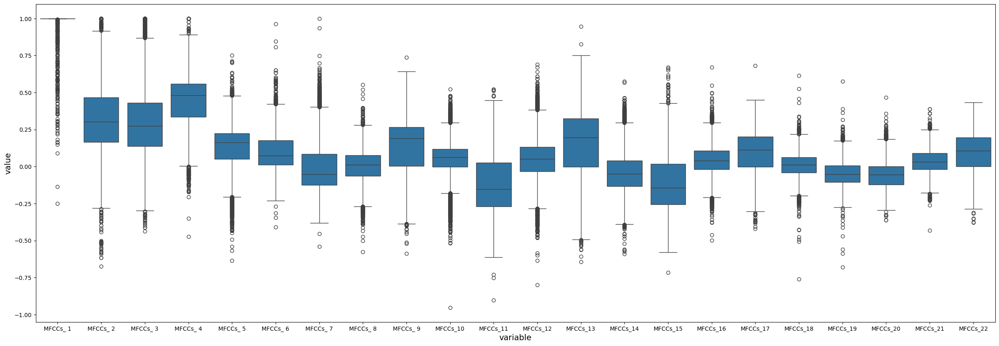

In [51]:
import seaborn as sns
import matplotlib.pyplot as plt

# display boxlots
plt.figure(figsize=(30,10))
sns.boxplot(x="variable", y="value", data=pd.melt(X))
plt.show()

Se han representado como outliers aquellos valores fuera del intervalo:

> $[Q_1 -1.5 \cdot IQR, Q_3 + 1.5 \cdot IQR ]$

, donde IQR es el rango intercuartílico.

Ya de esta forma tan básica se observa la gran cantidad de outliers presentes en el conjunto, que era una de nuestras hipótesis de partida.



También resulta interesante representar la correlación que existe entre las distintas características. Para ello, calculamos la matriz de correlación:

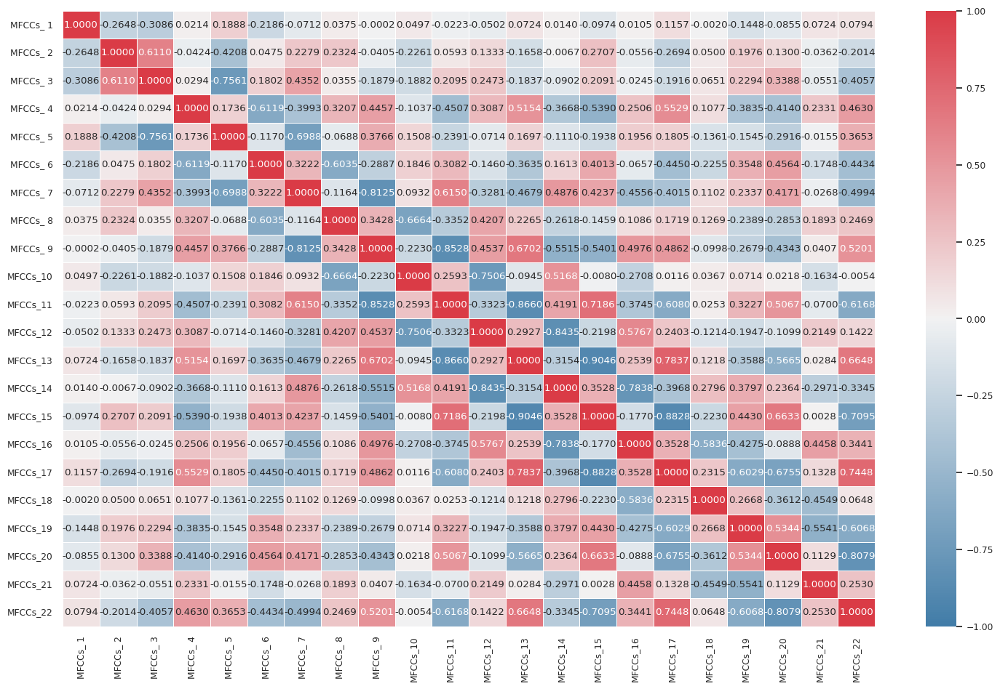

In [52]:
sns.set(font_scale=0.8)
plt.figure(figsize=(18,11))
sns.heatmap(X.corr(), annot=True, fmt=".4f",vmin=-1, vmax=1, linewidths=.5, cmap = sns.diverging_palette(240, 10, as_cmap=True))

plt.show()

Resulta interesante que, en la mayor parte de casos, la característica $i$ está negativamente correlacionada con las características $i-2$ y la $i+2$. En algunos casos llega a ser $-0.9$, por lo que es una correlación bastante importante.

### 2 - Detección y eliminación de _outliers_.

Utilizaremos al igual que en el ejercicio 3, un IsolationForest, para eliminar los valores atípicos.

Utilizaremos un valor no muy elevado, como el 5% de contaminación, ya que será complicado detectar los outliers, y no queremos perder mucha información.

In [53]:
!pip install pyod

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.5/160.5 kB 1.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyod: filename=pyod-1.1.3-py3-none-any.whl size=190250 sha256=faaaad465257b71d7b3ef3a9eef4d36eb6aff7e6e781e65bc74dd55b2f0924b4
  Stored in directory: /root/.cache/pip/wheels/05/f8/db/124d43bec122d6ec0ab3713fadfe25ebed8af52ec561682b4e
Successfully built pyod


Entrenamos el isolationForest:

In [54]:
from pyod.models.iforest import IForest

X_arr = X.to_numpy()

isft = IForest(contamination= 0.05, random_state=42)
isft.fit(X_arr)

# Training data
y_scores = isft.decision_function(X_arr)
y_pred = isft.predict(X_arr)

Representamos los scores, y el umbral obtenidos:

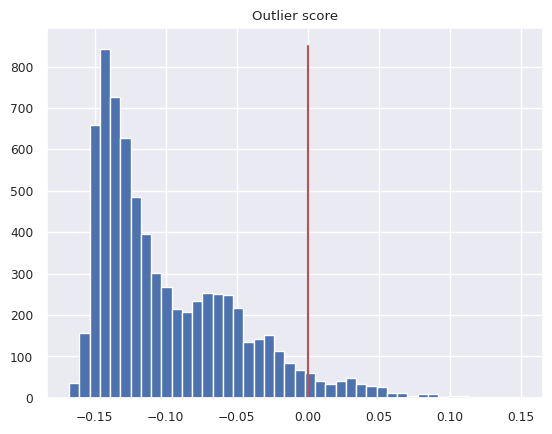

In [55]:
import matplotlib.pyplot as plt

threshold = isft.threshold_

plt.hist(y_scores, bins='auto') # arguments are passed to np.histogram

y_threshold = np.linspace(0,850, 100)
x_threshold = np.zeros_like(y_threshold) + threshold

plt.plot(x_threshold,y_threshold,c='r')
plt.title("Outlier score")
plt.show()

El umbral parece bastante razonable, así que continuamos con ese valor:

In [56]:
def descriptive_stat_threshold(df,pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score']< threshold, 'Normal', 'Outlier')

    anomalies_inds = df['Anomaly_Score'] >= threshold

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(columns={'Anomaly_Score':'Count'})
    cnt['Count %'] = (cnt['Count'] / cnt['Count'].sum()) * 100 # The count and count %
    stat = df.groupby('Group').mean().round(3).reset_index() # The avg.
    stat = cnt.merge(stat, left_on='Group',right_on='Group') # Put the count and the avg. together
    return stat, anomalies_inds

stat, anomalies_inds = descriptive_stat_threshold(X,y_scores, threshold) #y_train_scores = isft.decision_scores_
stat

,Group,Count,Count %,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Anomaly_Score
0,Normal,6835,94.996525,0.997,0.316,0.309,0.450,0.128,0.090,-0.009,0.000,0.134,0.057,-0.119,0.047,0.159,-0.046,-0.112,0.045,0.097,0.010,-0.052,-0.057,0.036,0.090,-0.106
1,Outlier,360,5.003475,0.856,0.468,0.345,0.372,0.102,0.248,0.139,-0.009,0.014,0.035,-0.048,-0.034,0.006,0.086,0.100,-0.010,-0.068,-0.027,-0.006,0.021,0.063,0.036,0.037


Eliminamos finalmente los outliers que hemos obtenido:

In [57]:
def remove_outliers(df, pred_score, threshold):
    df = pd.DataFrame(df)

    df['Anomaly_Score'] = pred_score
    df = df.iloc[(df['Anomaly_Score']< threshold).to_numpy()]
    df = df.drop(columns = ['Anomaly_Score'])

    return df

X_fixed = remove_outliers(X,y_scores,threshold)
X_fixed

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,MFCCs_11,MFCCs_12,MFCCs_13,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,0.188654,-0.075622,-0.156436,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,0.270958,-0.095004,-0.254341,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,0.266064,-0.072827,-0.237384,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162
3,1.0,0.224392,0.118985,0.329432,0.372088,0.361005,0.015501,-0.194347,-0.098181,0.270375,0.267279,-0.162258,-0.317084,-0.011567,0.100413,-0.050224,-0.136009,-0.177037,-0.130498,-0.054766,-0.018691,0.023954
4,1.0,0.087817,-0.068345,0.306967,0.330923,0.249144,0.006884,-0.265423,-0.172700,0.266434,0.332695,-0.100749,-0.298524,0.037439,0.219153,0.062837,-0.048885,-0.053074,-0.088550,-0.031346,0.108610,0.079244
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7190,1.0,-0.554504,-0.337717,0.035533,0.034511,0.443451,0.093889,-0.100753,0.037087,0.081075,0.065905,-0.000717,-0.145668,-0.059364,0.024206,-0.000861,0.069430,0.071001,0.021591,0.052449,-0.021860,-0.079860
7191,1.0,-0.517273,-0.370574,0.030673,0.068097,0.402890,0.096628,-0.116460,0.063727,0.089034,0.038545,0.000856,-0.164675,-0.105600,0.030767,0.006457,0.061127,0.068978,0.017745,0.046461,-0.015418,-0.101892
7192,1.0,-0.582557,-0.343237,0.029468,0.064179,0.385596,0.114905,-0.103317,0.070370,0.081317,0.062748,0.011868,-0.150025,-0.078615,0.024861,0.008696,0.082474,0.077771,-0.009688,0.027834,-0.000531,-0.080425
7193,1.0,-0.519497,-0.307553,-0.004922,0.072865,0.377131,0.086866,-0.115799,0.056979,0.089316,0.049792,-0.003997,-0.153120,-0.075320,0.022903,0.001924,0.051796,0.069073,0.017963,0.041803,-0.027911,-0.096895


Como hemos comprobado que hay algunas columnas que son prácticamente constantes, aplicamos una PCA preservando prácticamente toda la varianza, para eliminarlas:

In [58]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.99).set_output(transform="pandas")
X_pca = pca.fit_transform(X_fixed)

X_pca

,pca0,pca1,pca2,pca3,pca4,pca5,pca6,pca7,pca8,pca9,pca10,pca11,pca12,pca13,pca14,pca15
0,0.470070,0.697254,0.235561,-0.058254,-0.021950,0.104646,-0.114004,0.069971,0.140034,-0.000430,0.038729,0.072726,0.003808,-0.027490,-0.036462,-0.058101
1,0.517223,0.730597,0.269976,-0.086079,-0.066746,0.217547,-0.093088,-0.034654,0.085286,-0.056688,0.011609,0.046407,-0.010212,-0.003588,-0.001870,-0.028913
2,0.480590,0.713372,0.237720,-0.109037,-0.104655,0.261772,-0.060201,-0.010108,-0.005892,-0.064644,-0.053306,0.058408,-0.015186,-0.091074,0.049877,0.012263
3,0.544053,0.609505,0.237281,-0.032037,0.023161,0.286292,0.035094,-0.142016,-0.041852,-0.082204,0.106417,0.021700,-0.024683,0.142611,-0.175185,0.051464
4,0.504774,0.780745,0.269146,-0.152726,-0.086386,0.295643,-0.006739,-0.059018,-0.052483,-0.082580,-0.011155,0.055454,0.028175,-0.054943,0.001844,0.002098
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7190,0.175519,0.969976,0.244796,-0.553863,0.233626,-0.372191,-0.253657,0.200296,-0.090503,-0.163804,-0.015839,-0.039500,0.135069,0.062103,0.053991,-0.062119
7191,0.151840,0.971285,0.288050,-0.517986,0.221996,-0.349439,-0.259878,0.207998,-0.079481,-0.174015,-0.044829,-0.059954,0.127892,0.100940,0.062305,-0.058427
7192,0.137994,0.976187,0.255618,-0.574635,0.200361,-0.369671,-0.251366,0.212567,-0.116157,-0.153993,-0.021211,-0.046683,0.146086,0.072293,0.047818,-0.050362
7193,0.176989,0.948228,0.263566,-0.511873,0.236344,-0.363420,-0.253827,0.192491,-0.110693,-0.123602,-0.041034,-0.043824,0.107844,0.085320,0.050139,-0.048409


, quedándonos únicamente con 16 características.

### 3 - Algoritmos seleccionados: entrenamiento y selección de hiperparámetros.

Utilizaremos los siguientes dos modelos de clustering:

> **k Medias**

> **Clustering aglomerativo**



In [59]:
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering

#### 3.1 - K-Medias

Utilizaremos como valor de 'init' el método *k-means++*, que es en general el que obtiene mejores resultados. Como valor de 'n_init' 10 ejecuciones, para que el método obtenga varias soluciones, y se quede con la mejor.

Ajustaremos el número de clusters, tanto con el método del codo como con la puntuación de silueta:

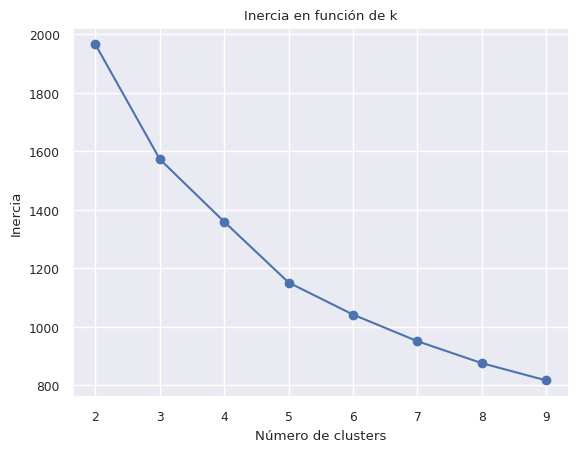

In [60]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

def plotk(X, n_clusters, plot_inertia=True):
  n_clusters = list(range(2,10))
  inertia = []
  silhouette = []

  for clusters in n_clusters:
    kmeans = KMeans(n_init=10, n_clusters = clusters, random_state=42)
    kmeans.fit(X)

    if plot_inertia:
      inertia.append(kmeans.inertia_)
    else:
      cluster_labels = kmeans.predict(X)
      silhouette_avg = silhouette_score(X, cluster_labels)
      silhouette.append(silhouette_avg)

  plt.xticks(n_clusters)

  if plot_inertia:
    plt.scatter(n_clusters, inertia)
    plt.plot(n_clusters, inertia)
    plt.xlabel('Número de clusters')
    plt.ylabel('Inercia')
    plt.title('Inercia en función de k')

  else:
    plt.scatter(n_clusters, silhouette)
    plt.plot(n_clusters, silhouette)
    plt.xlabel('Número de clusters')
    plt.ylabel('Puntuación de silueta')
    plt.title('Silhouette score en función de k')

  plt.show()

plotk(X_pca, list(range(2,10)))

De nuevo, no existe un valor claro en el que exista un codo, por lo que pasamos al análisis de silueta:

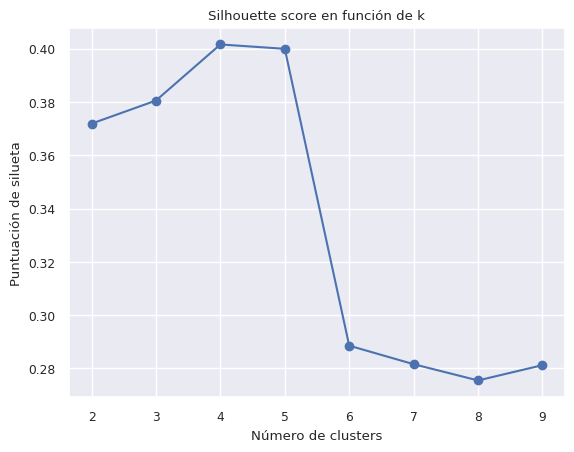

In [61]:
plotk(X_pca, list(range(2,10)), plot_inertia=False)

El mejor número de clusters que obtenemos es $k=4$, ligeramente mejor que $k=5$.

Aun así, la puntuación no es excesivamente elevada, ya que apenas supera $0.4$, por lo que podría haber algunos clusters solapados.

Podemos también hacer el análisis mediante los diagramas de silueta. Representamos las mejores soluciones que hemos obtenido (3,4 y 5):

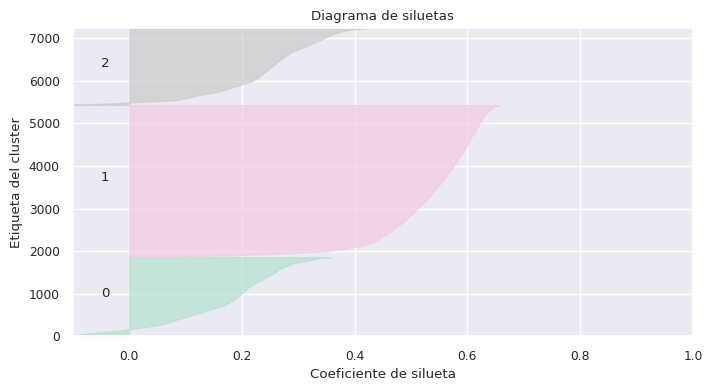

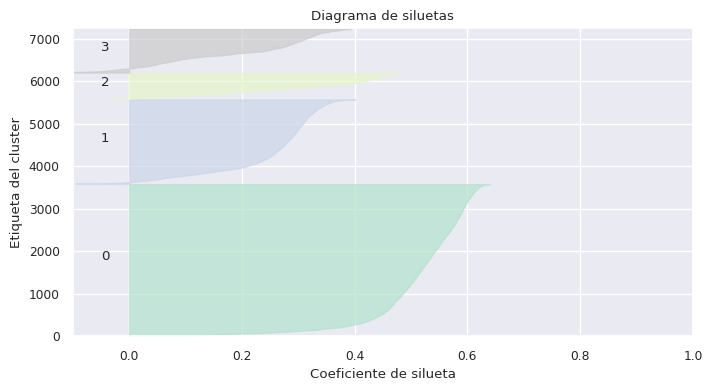

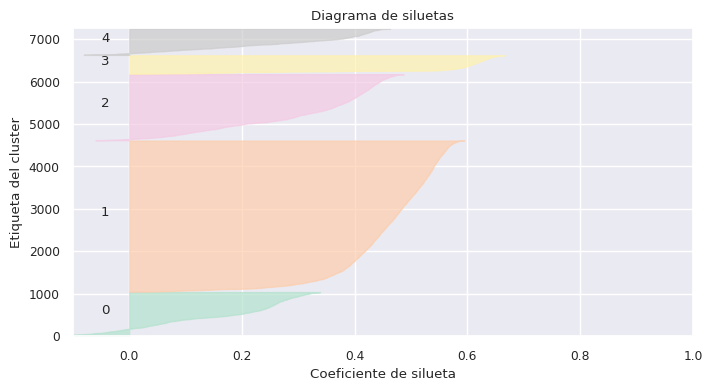

In [62]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples

range_n_clusters = [3, 4, 5]

for n_clusters in range_n_clusters:
    fig, ax1 = plt.subplots(1, figsize=(8,4))

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, n_init=10, random_state=42)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    #print(
    #    "For n_clusters =",
    #    n_clusters,
    #    "The average silhouette_score is :",
    #    silhouette_avg,
    #)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Pastel2(int(float(len(cm.Pastel2.colors)-1) / (n_clusters-1) * i))
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            color = color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de siluetas")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Etiqueta del cluster")

plt.show()

Observamos que en los tres casos hay un cluster con gran cantidad de puntos con muy buena puntuación. En el resto de clusters, todas las soluciones tienen más problemas.

La solución de 4 y 5 es algo mejor, ya que consiguen obtener otro cluster sin putuaciones negativas.

Sin embargo, todas las soluciones tienen dos clusters con puntuaciones de silueta bastante reducida (llegando en algunos puntos a ser negativa).

También es interesante comprobar que la eliminación de outliers y el PCA realizados en el punto 2 han conseguido mejorar los resultados, tanto en la inercia obtenida:

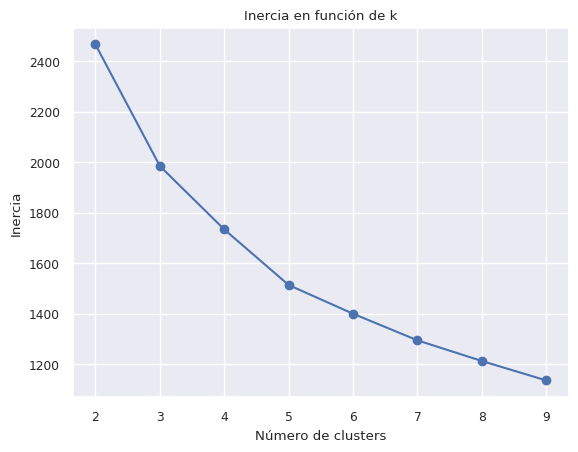

In [63]:
plotk(X.to_numpy(), list(range(2,10)))

como en la silueta:

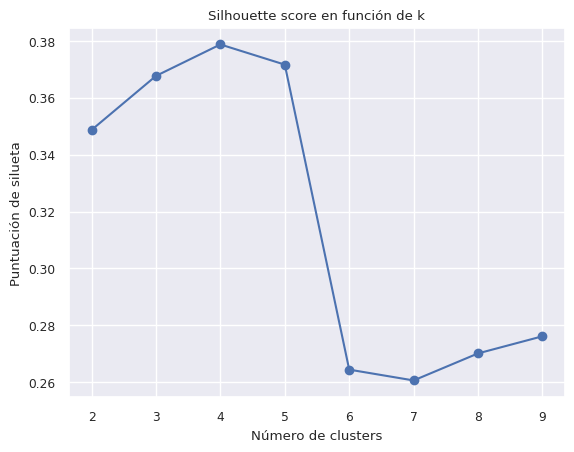

In [64]:
plotk(X.to_numpy(), list(range(2,10)), plot_inertia=False)

Nos quedamos por tanto con 4 clusters, aunque el resultado con $k=5$ sería muy similar.

In [65]:
kmeans = KMeans(n_clusters = 4, random_state=42, n_init=10)
kmeans.fit(X_pca)

KMeans(n_clusters=4, n_init=10, random_state=42)

Para hacernos una idea aproximada de cómo está actuando el modelo, podemos intentar reducir a 2 dimensiones el conjunto que tenemos, utilizando de nuevo PCA:

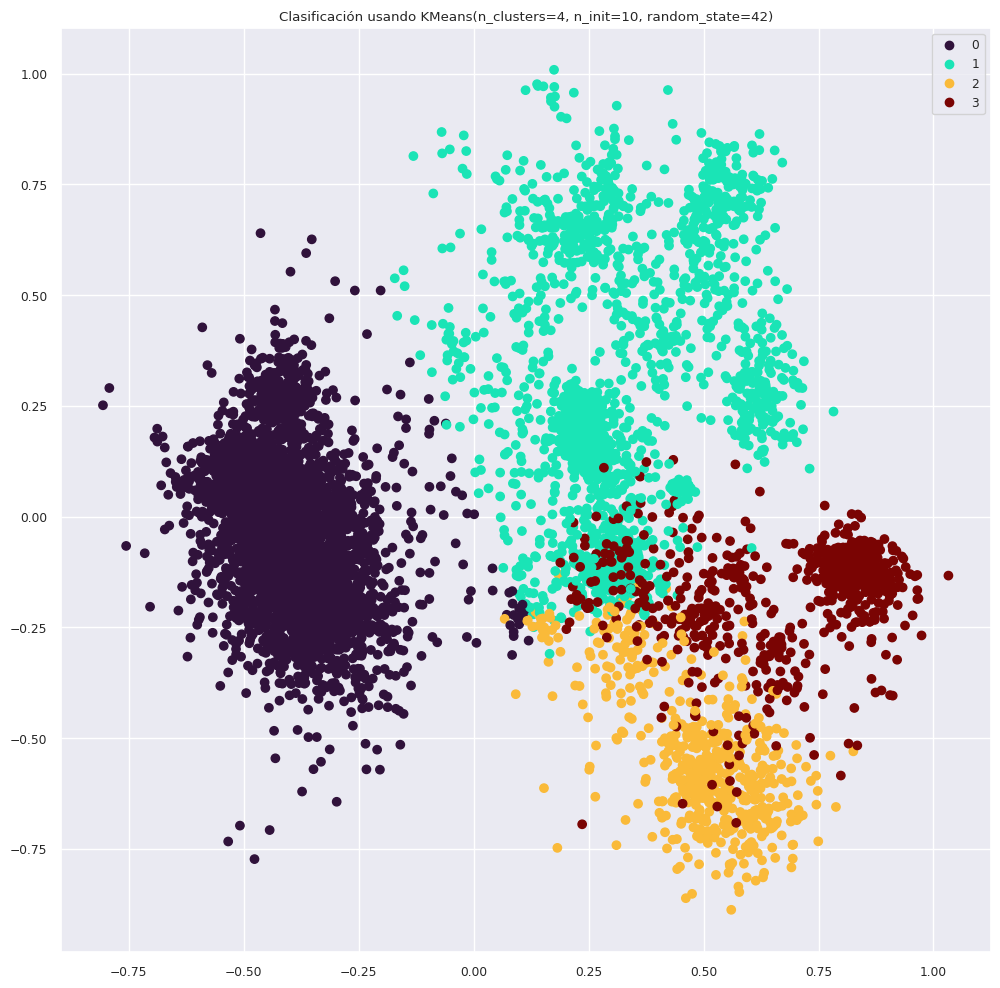

In [66]:
pca_2 = PCA(n_components=2, random_state=42).set_output(transform="pandas")
X_2 = pca_2.fit_transform(X_pca.to_numpy())

labels = kmeans.predict(X_pca)

fig = plt.figure(figsize=(12, 12))
scatter = plt.scatter(X_2['pca0'], X_2['pca1'], c=labels, cmap= 'turbo')
plt.legend(*scatter.legend_elements())

plt.title(f'Clasificación usando {kmeans}')

plt.show()

Aunque es una representación muy aproximada, podemos ver que ocurre aproximadamente lo que hemos visto en el punto anterior: el cluster número 0 está bastante bien separado de los demás.

En los otros tres clusters, hay instancias que están muy solapadas, lo que demuestra los coeficientes negativos que hemos obtenido anteriormente.

#### 3.2 - Clustering aglomerativo

Probamos con este algoritmo, para poder capturar clusters de diversas formas, y no solo circulares.

Aunque sabemos que no se adapta bien a grandes conjuntos de datos si no se proporciona una matriz de conectividad, intentaremos ajustarlo a estos datos:

In [67]:
from sklearn.cluster import AgglomerativeClustering

En este caso, no se puede hacer un análisis de la inercia, por lo que pasaremos a realizar el análisis únicamente en torno a la puntuación de silueta:

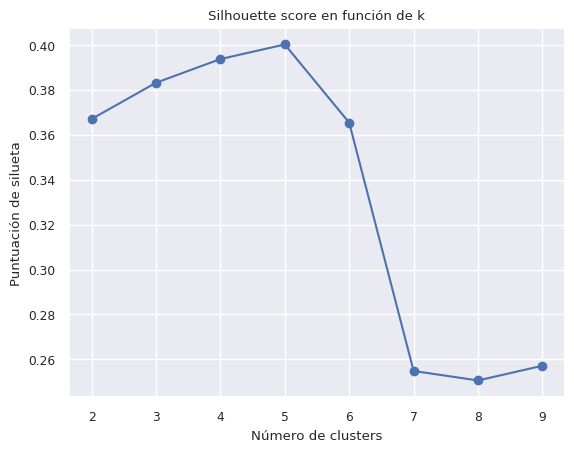

In [68]:
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

def plotkagc(X, n_clusters):
  n_clusters = list(range(2,10))
  silhouette = []

  for clusters in n_clusters:
    agc = AgglomerativeClustering(n_clusters = clusters)
    cluster_labels = agc.fit_predict(X)

    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette.append(silhouette_avg)

  plt.xticks(n_clusters)

  plt.scatter(n_clusters, silhouette)
  plt.plot(n_clusters, silhouette)
  plt.xlabel('Número de clusters')
  plt.ylabel('Puntuación de silueta')
  plt.title('Silhouette score en función de k')

  plt.show()

plotkagc(X_pca, list(range(2,10)))

Obtenemos de nuevo que los mejores valores para el número de clusters son 3,4 y 5. Sin embargo, en este caso, obtenemos que 5 clusters es ligeramente mejor que 4.

Volvamos a comprobar ahora los diagramas de silueta:

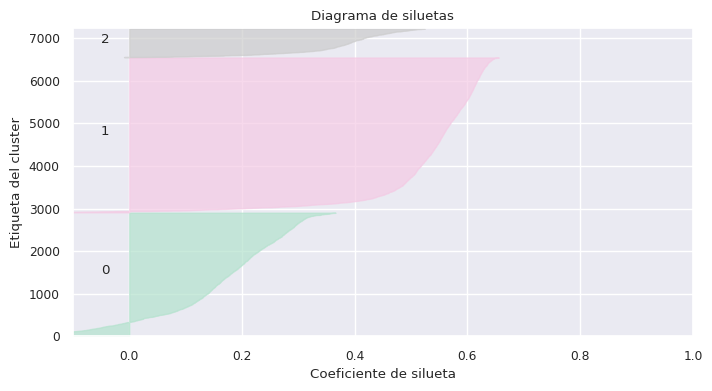

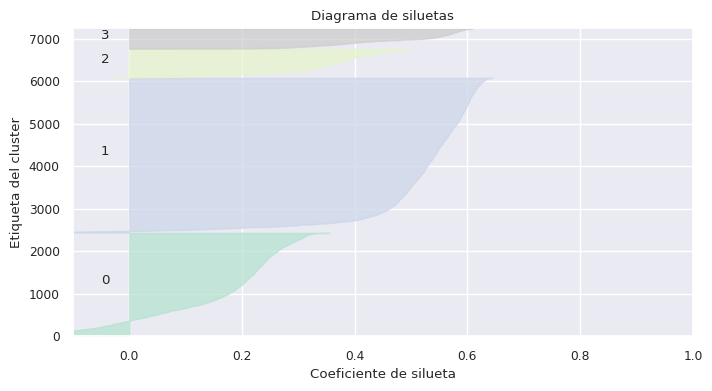

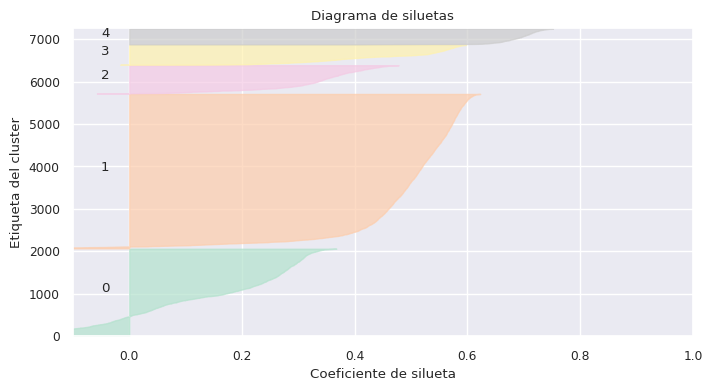

In [69]:
import matplotlib.cm as cm
from sklearn.metrics import silhouette_samples

range_n_clusters = [3, 4, 5]

for n_clusters in range_n_clusters:
    fig, ax1 = plt.subplots(1, figsize=(8,4))

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = AgglomerativeClustering(n_clusters=n_clusters)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    #print(
    #    "For n_clusters =",
    #    n_clusters,
    #    "The average silhouette_score is :",
    #    silhouette_avg,
    #)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.Pastel2(int(float(len(cm.Pastel2.colors)-1) / (n_clusters-1) * i))
        ax1.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            color = color,
            alpha=0.7,
        )

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Diagrama de siluetas")
    ax1.set_xlabel("Coeficiente de silueta")
    ax1.set_ylabel("Etiqueta del cluster")

plt.show()

Obtenemos resultados similares a los de K-Medias.

En los tres casos, obtenemos un cluster muy mayoritario con, en general, resultados bastante buenos.

En los tres casos, hay un cluster (el número 0) con bastantes valores negativos, y con resultados bastantes malos. Las mejoras de $k=4$ y $k=5$ vienen de eliminar de este cluster más y más ejemplos.

De nuevo, resulta interesante comprobar si lo realizado en el punto 2 ha mejorado los resultados:

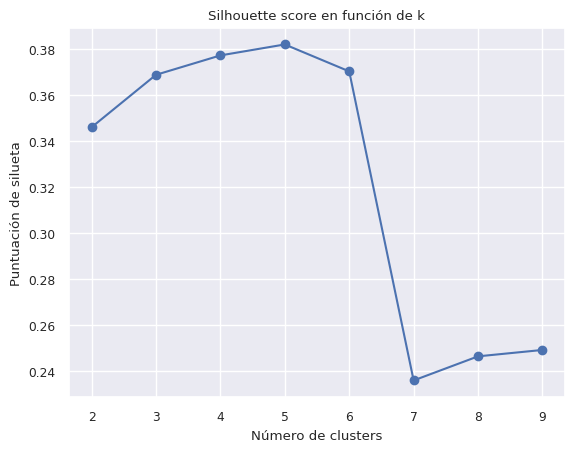

In [70]:
plotkagc(X.to_numpy(), list(range(2,10)))

De nuevo, se han vuelto a mejorar los resultados, por lo que queda totalmente justificado lo realizado en ese punto.

Nos decantaremos en este caso por $k=5$, ya que aunque tienen pocos ejemplos, los nuevos clusters que aparecen obtienen un coeficiente muy elevado. Sin embargo, en este caso, la diferencia es muy ligera y cualquiera de las elecciones de $k$ entre $3,4$ o $5$ podría ser correcta.

In [71]:
agc = AgglomerativeClustering(n_clusters = 5)
agc.fit(X_pca)

AgglomerativeClustering(n_clusters=5)

Podemos, de nuevo realizar una representación gráfica aproximada de lo obtenido:

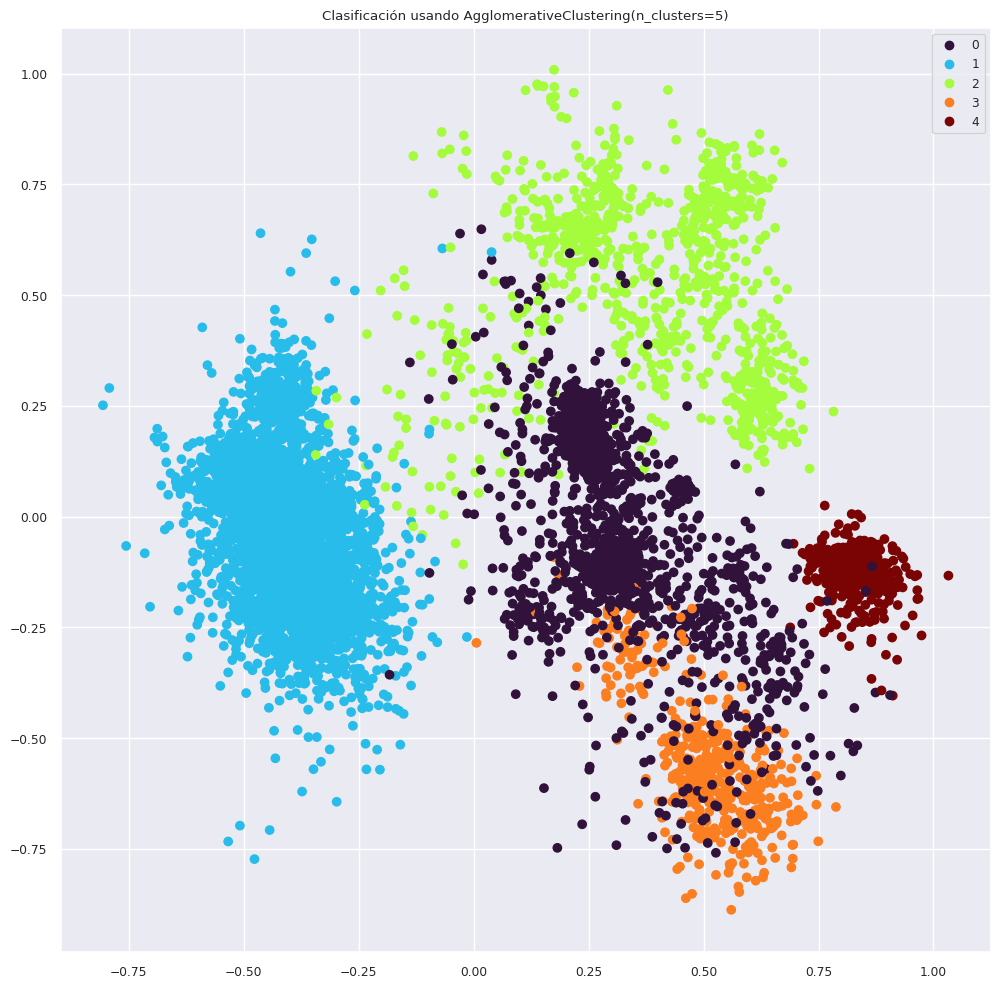

In [72]:
pca_2 = PCA(n_components=2, random_state=42).set_output(transform="pandas")
X_2 = pca_2.fit_transform(X_pca.to_numpy())

labels = agc.labels_

fig = plt.figure(figsize=(12, 12))
scatter = plt.scatter(X_2['pca0'], X_2['pca1'], c=labels, cmap= 'turbo')
plt.legend(*scatter.legend_elements())

plt.title(f'Clasificación usando {agc}')

plt.show()

Tenemos de nuevo un cluster muy mayoritario que parece bastante bien clasificado.

Sin embargo, resulta más complicado clasificar el resto de ejemplos.

La clasificación es similar a la obtenida por KMedias, y la diferencia más clara es que en los puntos centrales de estos puntos aparece un nuevo cluster.

### 4 - Validación de los modelos

Antes de comparar con nuestro ground truth, comprobemos cuál sería nuestro mejor modelo:

In [73]:
cluster_labels = kmeans.fit_predict(X_pca)
silhouette_avg = silhouette_score(X_pca, cluster_labels)

print(f'Modelo = {kmeans}')
print(f'Puntuación de silueta = {silhouette_avg}')

Modelo = KMeans(n_clusters=4, n_init=10, random_state=42)
Puntuación de silueta = 0.4015931100942871


In [74]:
cluster_labels = agc.fit_predict(X_pca)
silhouette_avg = silhouette_score(X_pca, cluster_labels)

print(f'Modelo = {agc}')
print(f'Puntuación de silueta = {silhouette_avg}')

Modelo = AgglomerativeClustering(n_clusters=5)
Puntuación de silueta = 0.40017633724482693


Obtenemos que, aunque el modelo KMedias obtiene un resultado ligeramente superior al clustering aglomerativo, los modelos obtienen prácticamente el mismo resultado.

Por tanto, sin ninguna otra información, podríamos elegir cualquiera de los dos modelos, para la predicción.

Comprobemos cómo funcionan nuestros dos modelos teniendo en cuenta ahora el ground Truth.

Podemos hacer un análisis bastante variado, ya que podemos ver cómo funcionan los modelos en cuanto a la clasificación por Familia (4) , Género (8) y finalmente Especie (10).

#### **Distribución de los datos ground Truth**

Puede ser interesante primeramente comprobar cómo se distribuyen los datos que tenemos por familia, género y especie:

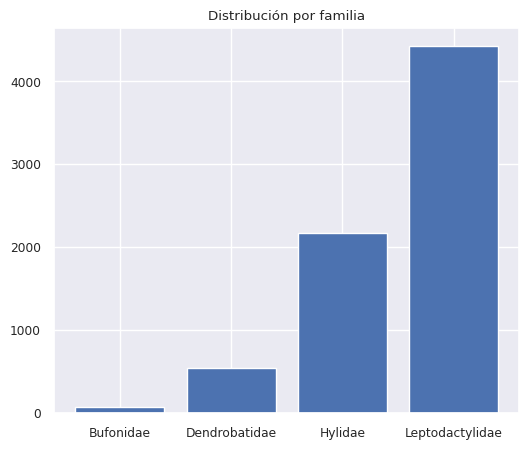

In [75]:
count = []
plt.figure(figsize=(6,5))

# Familia
for label in np.unique(df_frogs.Family):
  count.append(df_frogs[df_frogs.Family == label].shape[0])

plt.bar(np.unique(df_frogs.Family), count)
plt.title('Distribución por familia')
plt.show()

Comprobamos que en general, la distribución por familia está muy desbalanceada. Es algo a tener en cuenta, ya que nuestro modelo puede tender a no detectar prácticamente las ranas de la familia 'Bufonidae', o incluso a considerarlas outliers.

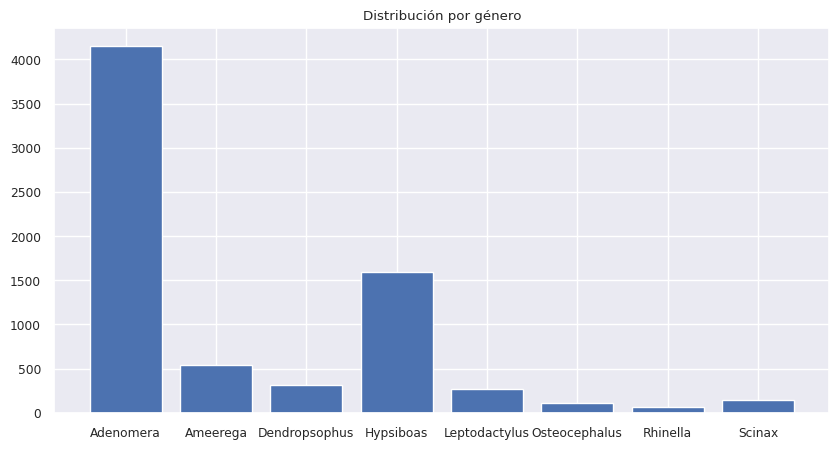

In [76]:
count = []
plt.figure(figsize=(10,5))

# Género
for label in np.unique(df_frogs.Genus):
  count.append(df_frogs[df_frogs.Genus == label].shape[0])

plt.bar(np.unique(df_frogs.Genus), count)
plt.title('Distribución por género')
plt.show()

De nuevo, la distribución vuelve a ser muy desbalanceada, siendo prácticamente todos los ejemplos de los géneros 'Adenomera' y 'Hypsiboas'.

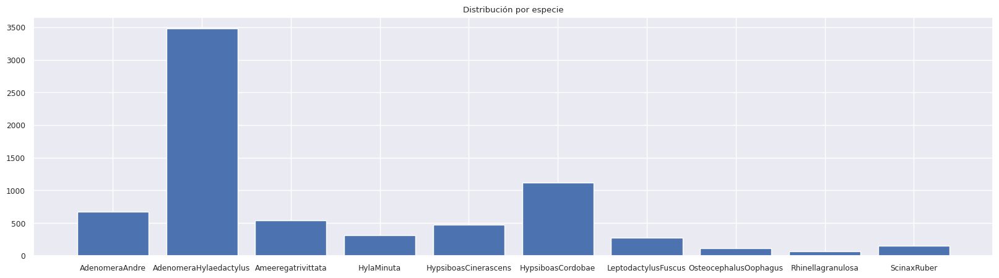

In [77]:
count = []
plt.figure(figsize=(20,5))

# Género
for label in np.unique(df_frogs.Species):
  count.append(df_frogs[df_frogs.Species == label].shape[0])

plt.bar(np.unique(df_frogs.Species), count)
plt.title('Distribución por especie')
plt.show()

En cuanto a la especie, vuelve a ocurrir algo similar, una distribución muy desbalanceada.

Como vemos, en principio ya va a ser bastante complicado que los resultados sean muy ajustados al ground truth.

#### **Métricas a utilizar**

- **Homogeneidad:**
El resultado obtenido es homogéneo (valor 1) si todos los clusters contienen únicamente ejemplos que son de una única clase en el ground-truth (entre 0 y 1).

- **Completitud:**
El resultado obtenido satisface la completitud (valor 1) si todos los datos de una misma clase en el ground-truth, pertenecen todos al mismo cluster (entre 0 y 1).

- **Medida V:**
De forma similar al F1-score en clasificación, realiza la media armónica de los dos valores anteriores, para valorar ambos.





In [78]:
from sklearn.metrics import completeness_score
from sklearn.metrics import homogeneity_score
from sklearn.metrics import v_measure_score
from sklearn.metrics import fowlkes_mallows_score

Eliminamos primero los outliers del conjunto ground Truth, ya que no los hemos considerado en nuestro estudio:

In [79]:
Y_fixed = Y.drop(Y[anomalies_inds].index)

#### **Comparación por familia**

In [80]:
print(f'Modelo = {kmeans}' )
print(f'Homogeneidad = {homogeneity_score(Y_fixed.Family, kmeans.labels_)}')
print(f'Completitud = {completeness_score(Y_fixed.Family, kmeans.labels_)}')
print(f'Medida-V = {v_measure_score(Y_fixed.Family, kmeans.labels_)}')

Modelo = KMeans(n_clusters=4, n_init=10, random_state=42)
Homogeneidad = 0.5214564912762409
Completitud = 0.40310875106440824
Medida-V = 0.4547081488822527


In [81]:
print(f'Modelo = {agc}' )
print(f'Homogeneidad = {homogeneity_score(Y_fixed.Family, agc.labels_)}')
print(f'Completitud = {completeness_score(Y_fixed.Family, agc.labels_)}')
print(f'Medida-V = {v_measure_score(Y_fixed.Family, agc.labels_)}')

Modelo = AgglomerativeClustering(n_clusters=5)
Homogeneidad = 0.6312982845786898
Completitud = 0.431234346293227
Medida-V = 0.5124313271074379


En contraposición a lo ocurrido antes de revisar el ground Truth, el clustering aglomerativo obtiene ligeramente mejores resultados que el modelo de las K-Medias, a pesar de que el modelo de K-Medias acierta el número de clusters correcto.

En concreto, la mejora es especialmente en la homogeneidad del modelo, es decir, más puntos de un determinado cluster pertenecen a la misma clase que en el modelo de las K-Medias, algo que es normal al considerar un mayor número de clusters.

Sin embargo, también supera al modelo en la completitud, es decir los puntos de una clase pertenecen en mayor medida al mismo cluster en el clustering aglomerativo, medida que en general disminuye cuando el número de clusters aumenta.

Aun así, ambos modelos fallan bastante, y no se obtienen valores cercanos a 1 en ninguno de los casos.

Intentemos comprobar gráficamente cómo han funcionado los dos modelos:

- Representamos aproximadamente (PCA -> 2 dimensiones) el ground truth respecto a la familia:

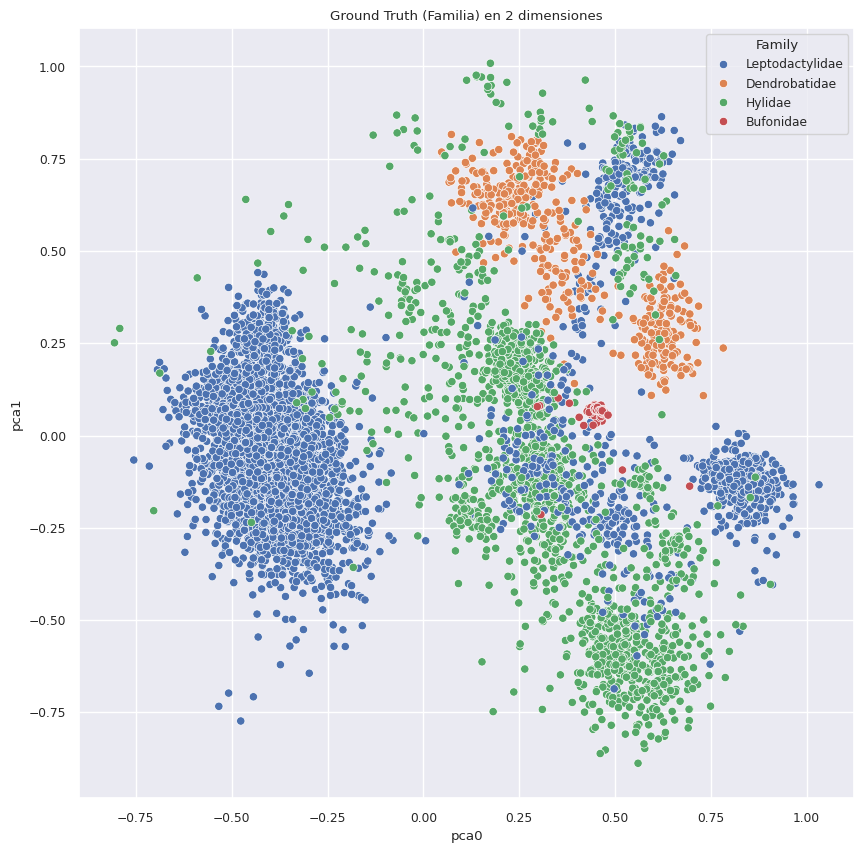

In [82]:
pca_2 = PCA(n_components=2, random_state=42).set_output(transform="pandas")
X_2 = pca_2.fit_transform(X_pca)

labels = Y_fixed.Family

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x=X_2['pca0'], y=X_2['pca1'], hue=labels, palette="deep")

plt.title('Ground Truth (Familia) en 2 dimensiones')

plt.show()

Aunque sea una representación aproximada, ya podemos ver que va a ser complicado que algún modelo funcione bien con estos datos.

Vemos que los clusters tienen aproximadamente forma redondeada, por lo que se esperaría que un modelo como KMedias funcione bastante mejor que por ejemplo DBSCAN.

Así a primera vista podemos observar que hay un conjunto grande a la izquierda que es fácil de delimitar del resto.

Salvo esa parte, parece muy complicado delimitar el resto de familias únicamente viendo este diagrama, ya que están muy solapadas.

También llama la atención lo dispersos que están los individuos de una determinada especie. Por ejemplo, los individuos de la familia 'Leptodactylidae' (representados en azul) están, por una parte concentrados a la izquierda en la zona ya comentada; concentrados a la derecha en el diagrama en una pequeña región, y también se llegan a prácticamente solapar con el resto de familias en el centro del diagrama.

También podemos ver que va a ser muy complicado que algún modelo consiga identificar a las ranas del modelo Bufonidae, debido a la pequeña cantidad que existe de ellas.



- Comparamos con nuestro modelo de las **k-Medias**:

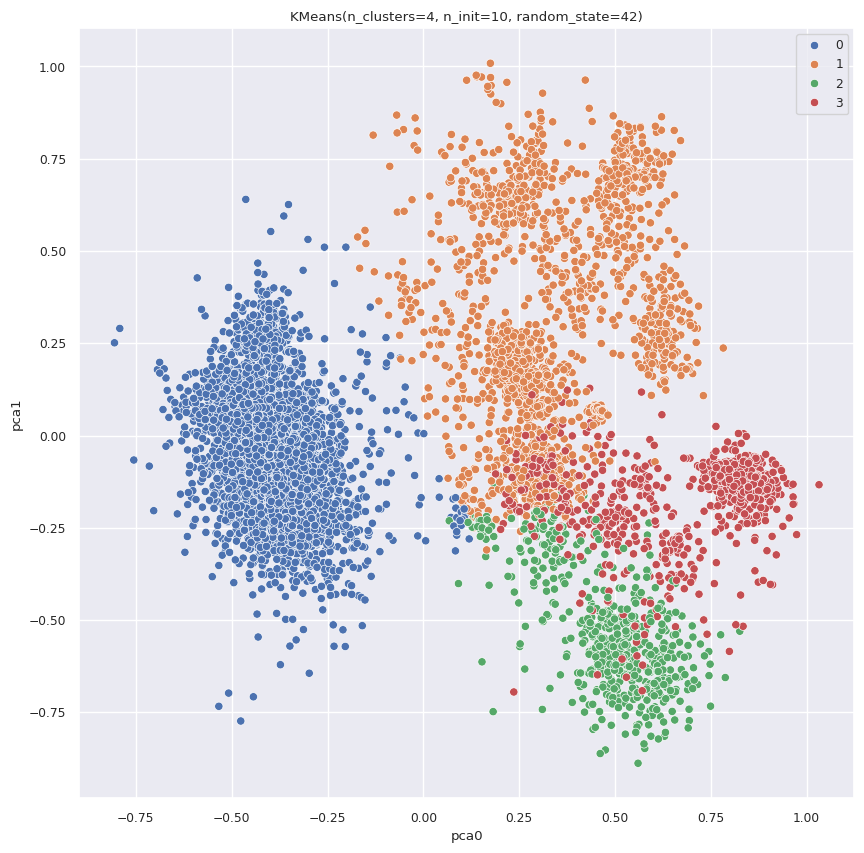

In [83]:
pca_2 = PCA(n_components=2, random_state=42).set_output(transform="pandas")
X_2 = pca_2.fit_transform(X_pca)

labels = kmeans.labels_

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x=X_2['pca0'], y=X_2['pca1'], hue=labels, palette="deep")

plt.title(f'{kmeans}')
plt.show()

El modelo de KMedias clasifica bastante bien a los individuos de la familia 'Leptodactylidae', aunque los separa en el cluster 0 y 3 (azul y rojo en la imagen), pero son clusters bastante homogéneos.

También el cluster 2 es bastante homogéneo, ya que prácticamente solo contiene individuos de la familia 'Hylidae'. Es en el cluster número 1, donde comete muchos errores, ya que llega a contener individuos de todas las familias.

Como advertíamos, el modelo k-Means ignora por completo a la familia 'Bufonidae', muy minoritaria.

- Comparamos con nuestro modelo del **clustering aglomerativo**:

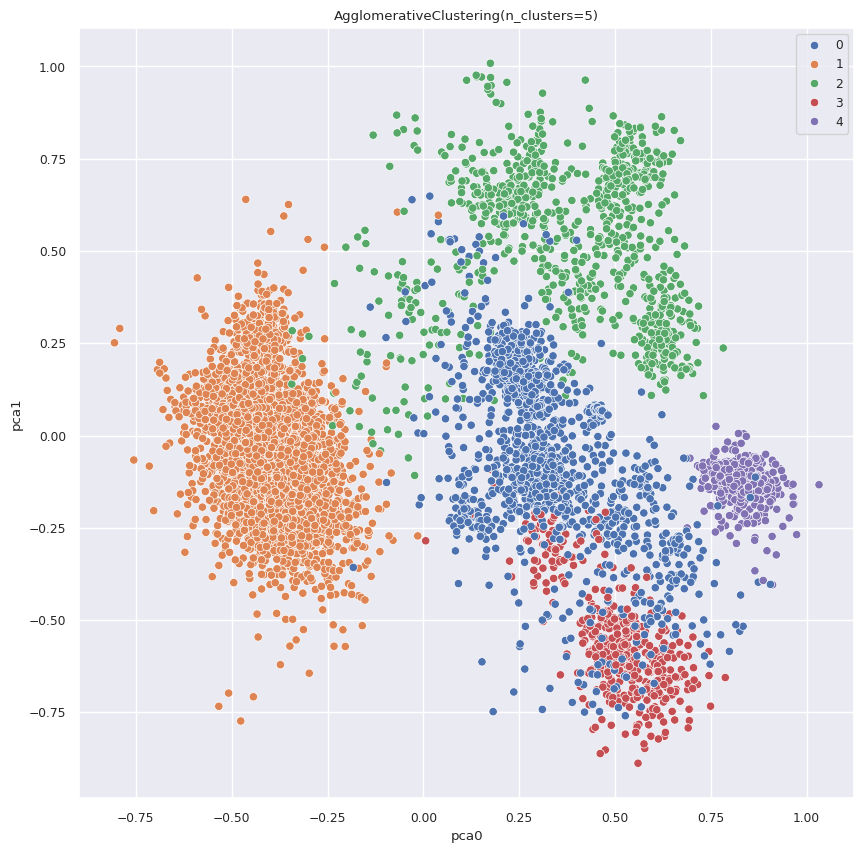

In [84]:
pca_2 = PCA(n_components=2, random_state=42).set_output(transform="pandas")
X_2 = pca_2.fit_transform(X_pca)

labels = agc.labels_

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x=X_2['pca0'], y=X_2['pca1'], hue=labels, palette="deep")

plt.title(f'{agc}')
plt.show()

La clasificación es similar a la realizada por K-Medias, ya que de nuevo el cluster 1, 4 y 3 son bastante homogéneos incluyendo únicamente a una familia de ranas.

La principal diferencia viene de dividir en dos clusters el cluster en el que más fallaba K-Medias, lo que permite incrementar ligeramente el resultado, aunque aun así, sigue fallando bastante en esos 2 clusters (0 y 2).

#### **Comparación por género**

In [85]:
print(f'Modelo = {kmeans}' )
print(f'Homogeneidad = {homogeneity_score(Y_fixed.Genus, kmeans.labels_)}')
print(f'Completitud = {completeness_score(Y_fixed.Genus, kmeans.labels_)}')
print(f'Medida-V = {v_measure_score(Y_fixed.Genus, kmeans.labels_)}')

Modelo = KMeans(n_clusters=4, n_init=10, random_state=42)
Homogeneidad = 0.45924249279257057
Completitud = 0.5101108008665394
Medida-V = 0.48334195039677114


In [86]:
print(f'Modelo = {agc}' )
print(f'Homogeneidad = {homogeneity_score(Y_fixed.Genus, agc.labels_)}')
print(f'Completitud = {completeness_score(Y_fixed.Genus, agc.labels_)}')
print(f'Medida-V = {v_measure_score(Y_fixed.Genus, agc.labels_)}')

Modelo = AgglomerativeClustering(n_clusters=5)
Homogeneidad = 0.6187880748579655
Completitud = 0.6073499151213456
Medida-V = 0.6130156439397617


Ambos modelos mejoran bastante, especialmente el clustering aglomerativo, que mejora mucho en completitud. Es decir, individuos de la misma clase pertenecen en muchos casos al mismo cluster.

Veamos de nuevo cómo es la representación de los datos en este caso:

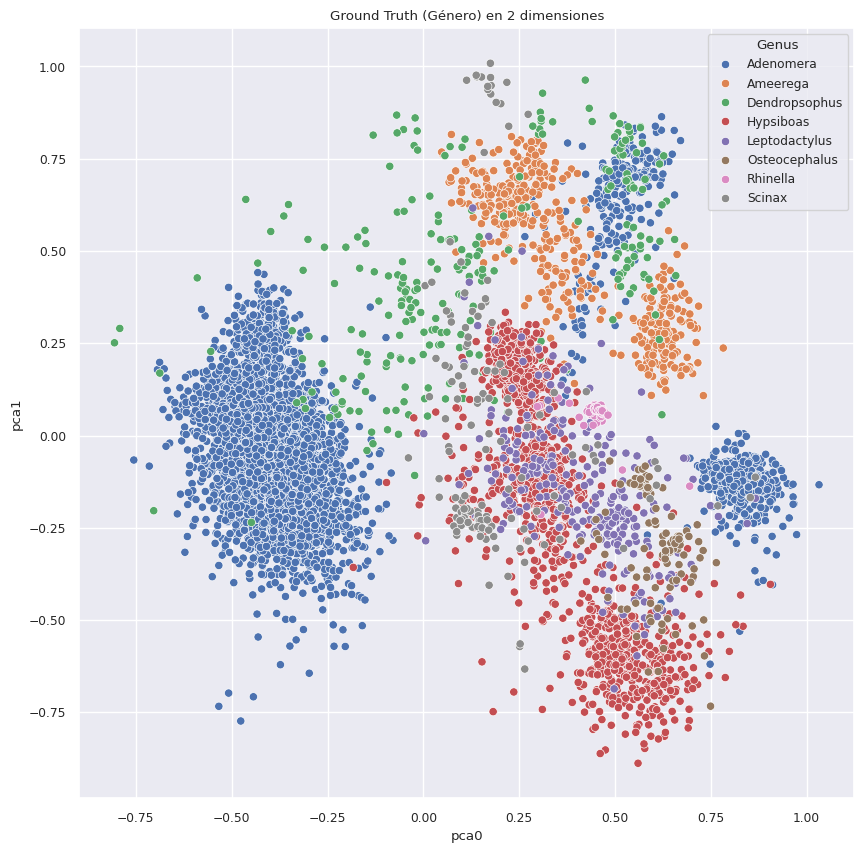

In [87]:
pca_2 = PCA(n_components=2, random_state=42).set_output(transform="pandas")
X_2 = pca_2.fit_transform(X_pca)

labels = Y_fixed.Genus

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x=X_2['pca0'], y=X_2['pca1'], hue=labels, palette="deep")

plt.title('Ground Truth (Género) en 2 dimensiones')
plt.show()

Viendo las figuras anteriores, comprobamos que la mejora viene de que el cluster más central del AGC, incluye de forma completa a varios géneros (Rhinella, Scinax, Leptodactylus), mientras que en K-Medias esto no ocurre.

#### **Comparación por especie**

In [88]:
print(f'Modelo = {kmeans}' )
print(f'Homogeneidad = {homogeneity_score(Y_fixed.Species, kmeans.labels_)}')
print(f'Completitud = {completeness_score(Y_fixed.Species, kmeans.labels_)}')
print(f'Medida-V = {v_measure_score(Y_fixed.Species, kmeans.labels_)}')

Modelo = KMeans(n_clusters=4, n_init=10, random_state=42)
Homogeneidad = 0.5621060675043742
Completitud = 0.8099868570655859
Medida-V = 0.663655527701323


In [89]:
print(f'Modelo = {agc}' )
print(f'Homogeneidad = {homogeneity_score(Y_fixed.Species, agc.labels_)}')
print(f'Completitud = {completeness_score(Y_fixed.Species, agc.labels_)}')
print(f'Medida-V = {v_measure_score(Y_fixed.Species, agc.labels_)}')

Modelo = AgglomerativeClustering(n_clusters=5)
Homogeneidad = 0.6931870340294026
Completitud = 0.8826422568593588
Medida-V = 0.7765259494526643


Como es lógico, al aumentar el número de clases posibles, aumenta la completitud.

Ambos modelos mejoran bastante, incrementando también bastante la homogeneidad, y por tanto la media armónica de ambos.

Destaca bastante los buenos resultados que acaba obteniendo el clustering aglomerativo.

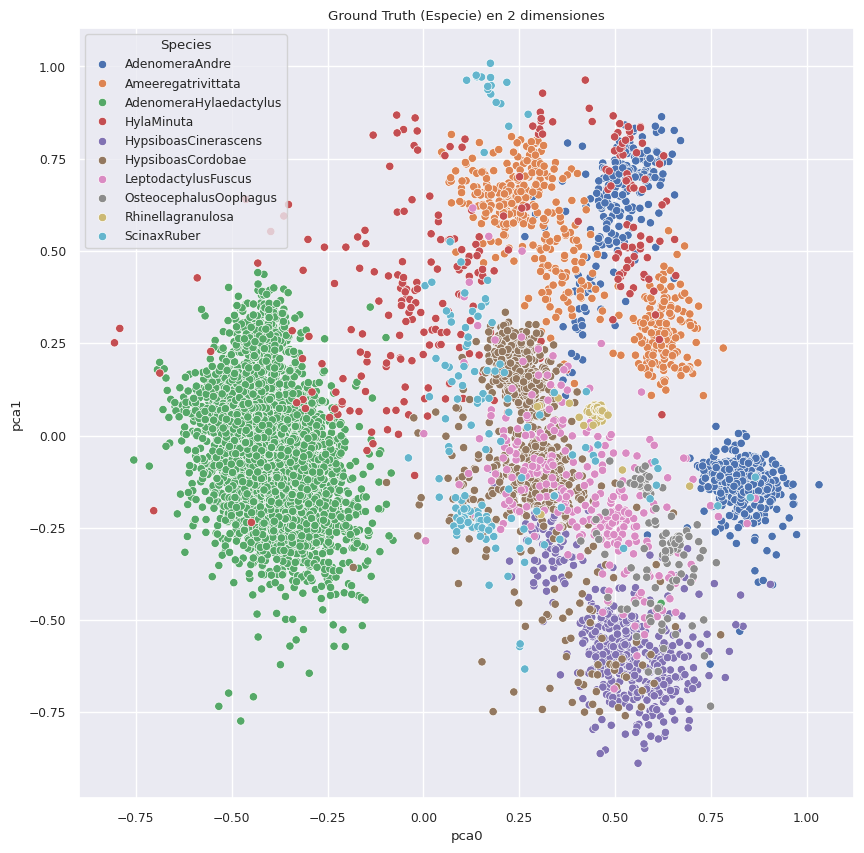

In [90]:
pca_2 = PCA(n_components=2, random_state=42).set_output(transform="pandas")
X_2 = pca_2.fit_transform(X_pca)

labels = Y_fixed.Species

fig = plt.figure(figsize=(10, 10))
sns.scatterplot(x=X_2['pca0'], y=X_2['pca1'], hue=labels, palette="deep")

plt.title('Ground Truth (Especie) en 2 dimensiones')
plt.show()

Cuando vimos la clasificación por familias y por géneros, resultaba extraño la gran dispersión entre individuos de la misma clase. De hecho, los modelos los clasificaban en distintos clusters a estos individuos.

Esto se debía, a como vemos en los clusters representados en azul y verde, a que pertenecían a distintas especies, lo cual nos muestra la gran diferencia que existe entre individuos de distintas especies, a pesar de ser del mismo género.

En cuanto a la mejoría de resultados, vemos que en este caso existen tres especies, las del género Adenomera (verde y azul) y la 'Hypsiboas Cinerascens' (en morado), que ambos modelos clasifican muy bien en tres clusters diferentes (en el caso del AGC, la clasificación es prácticamente perfecta).

Sin embargo, la clasificación empeora mucho en el resto de clases. AGC divide al resto de clases en 2 clusters, que cada uno engloba entre 3 y 4 especies distintas. El problema se agrava en el caso del K-Medias, que engloba al resto de clases en un único cluster, muy heterogéneo.

Realizábamos al comienzo la pregunta de si, aunque dos especies fueran distintas, su canto podía ser prácticamente indistinguible.

Hemos visto que hay 3 especies que se distinguen bastante bien del resto (en especial la representada en verde en el anterior diagrama).

El resto de especies, han sido confundidas entre ellas por ambos modelos. Llama bastante la atención, ya que siendo anuros de distinta familia y género, ha sido prácticamente imposible distinguirlos unos de otros.

## <font color='blue'>Ejercicio 3. DETECCIÓN de ANOMALÍAS con PyOD



### <font color='blue'> Ejemplo de uso de IsolationForest en un conjunto sintético.

<font color='blue'>A continuación, se muestra un ejemplo de uso de IsolationForest (https://pyod.readthedocs.io/en/latest/_modules/pyod/models/iforest.html) en un conjunto sintético. PyOD ofrece un wrapper del Isolation Forest de scikit-learn (https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.IsolationForest.html) con más funcionalidades.

#### <font color='blue'>Paso 1: Construimos el Modelo

<font color='blue'>Generamos $6$ variables y $500$ instancias para entrenamiento y test. Aunque los datos tienen la variable target $Y$, los modelos no supervisados solo usarán las variables $X$. La variable $Y$ es solo para validación. El porcentaje de outliers se pone al $5\%$ con `contamination=0.05`. Se dibuja un scatter plot de las dos primeras variables. Los puntos amarillos son outliers, y los puntos violeta son los datos normales.

In [91]:
!pip install pyod

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pyod.utils.data import generate_data
contamination = 0.05 # percentage of outliers
n_train = 500       # number of training points
n_test = 500        # number of testing points
n_features = 6      # number of features
X_train, X_test, y_train, y_test = generate_data(
    n_train=n_train,
    n_test=n_test,
    n_features= n_features,
    contamination=contamination,
    random_state=123)

X_train_pd = pd.DataFrame(X_train)
X_train_pd.head()

,0,1,2,3,4,5
0,2.396090,2.092611,2.073392,1.988262,1.953473,2.450997
1,1.631040,1.746182,1.898050,2.380148,1.967332,1.858916
2,1.824683,2.131412,2.028829,1.703454,2.502966,2.119108
3,2.106098,2.165173,2.340826,2.170109,1.749139,1.678661
4,1.829647,1.775596,1.829438,2.054768,1.577190,1.594549


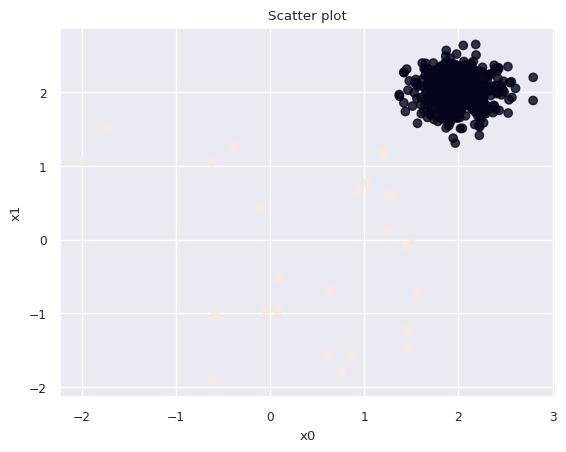

In [92]:
plt.scatter(X_train_pd[0], X_train_pd[1],c=y_train, alpha=0.8)
plt.title('Scatter plot')
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

<font color='blue'>Declaramos y ajustamos el modelo. El tamaño de un árbol `max_samples`es de $40$ instancias. En Isolation Forest (IForest, https://pyod.readthedocs.io/en/latest/pyod.models.html#module-pyod.models.iforest), no es necesario asignar un tamaño de árbol grande, puesto que tamaños pequeños pueden producir mejores iTrees. El porcentaje de outliers será $5\%$ usando `contamination=0.05`. Si no se indica, este valor se fijará automáticamente en $10\%$.

<font color='blue'>La función `decision_function()` genera el _outlier score_ de cada ejemplo del conjunto de datos, y la función `predict()` assigna las etiquetas ($1$: outlier; $0$: no outlier) basándose en la tasa de contaminación proporcionada ($5\%$ en nuestro caso). El umbral que vemos más abajo (`threshold_`) se emplea para identificar los `n_samples*contamination` ejemplos más atípicos de acuerdo a su `decision_scores_`.

In [93]:
from pyod.models.iforest import IForest
isft = IForest(contamination=0.05, max_samples=40, behaviour='new')
isft.fit(X_train)

# Training data
y_train_scores = isft.decision_function(X_train)
y_train_pred = isft.predict(X_train)

# Test data
y_test_scores = isft.decision_function(X_test)
y_test_pred = isft.predict(X_test) # outlier labels (0 or 1)

# Threshold for the defined comtanimation rate
print("The threshold for the defined contamination rate:" , isft.threshold_)

def count_stat(vector):
    # Because it is '0' and '1', we can run a count statistic.
    unique, counts = np.unique(vector, return_counts=True)
    return dict(zip(unique, counts))

print("The training data :", count_stat(y_train_pred))
print("The test data:", count_stat(y_test_pred))


The threshold for the defined contamination rate: -5.937958458268611e-15
The training data : {0: 475, 1: 25}
The test data: {0: 473, 1: 27}


<font color='blue'> Vemos que, efectivamente, este número de ejemplos más atípicos se corresponde con `X_train.shape[0]*0.05`.

In [94]:
X_train.shape[0]*0.05

25.0

<font color='blue'> Vamos a intentar marcar con una cruz roja los $25$ ejemplos más atípicos en la figura.  

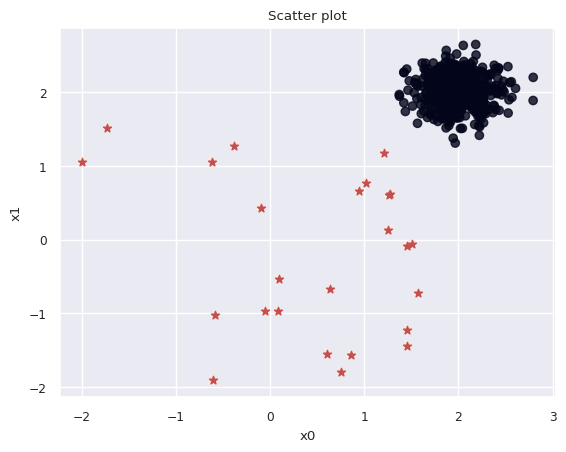

In [95]:
plt.scatter(X_train_pd[0], X_train_pd[1],c=y_train, alpha=0.8)
indexes = np.squeeze(np.array(np.where(isft.threshold_ < isft.decision_scores_)))
plt.scatter(X_train[indexes,0], X_train[indexes,1],marker='*',color='r')
plt.title('Scatter plot')
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

##### <font color='blue'>Paso 1.1: Parámetros del Modelo

In [96]:
isft.get_params()

{'behaviour': 'new',
 'bootstrap': False,
 'contamination': 0.05,
 'max_features': 1.0,
 'max_samples': 40,
 'n_estimators': 100,
 'n_jobs': 1,
 'random_state': None,
 'verbose': 0}

* <font color='blue'>`max_samples` es el número de muestras a escoger en $X$ para entrenar cada estimador base.
* <font color='blue'>`n_estimators` es el número de árboles en el ensemble. El valor por defecto es de 100 árboles.
* <font color='blue'>`max_features` es el número de características a escoger en $X$ para entrenar cada estimador base. El valor por defecto es $1.0$.
* <font color='blue'>`n_jobs` es el número de tareas a ejecutar en paralelo para `fit`y `predict`. El valor por defecto es $1.0$. Si se pone a $-1$, el número de tareas se iguala al número de cores.

##### <font color='blue'>Paso 1.2: Importancia de las Variables

<font color='blue'>Debido a que IForest trabaja dentro del marco de los árboles de decisión, podemos calcular y entender la importancia relativa de las características para determinar outliers. La importancia de las características se mide por el [índice de impureza Gini](https://en.wikipedia.org/wiki/Decision_tree_learning#Gini_impurity), cuya suma es $1.0$. A mayor valor, mayor importancia tiene la característica. En nuestro caso, la primera (índice $0$) y quinta (índice $4$) características serían las más relevantes.

In [97]:
isft_vi = isft.feature_importances_
isft_vi

array([0.13322735, 0.18271343, 0.19738877, 0.16054109, 0.15652314,
       0.16960622])

In [98]:
np.sum(isft_vi)

1.0000000000000002

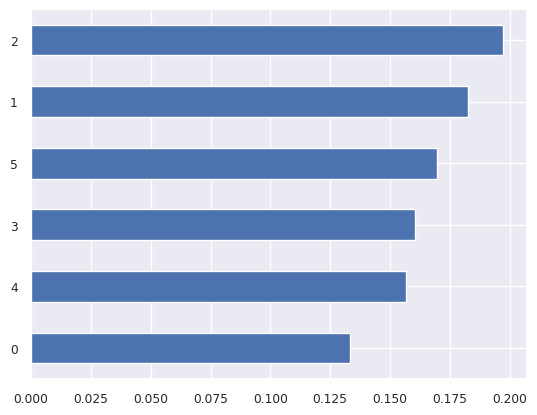

In [99]:
from matplotlib import pyplot as plt
for_plot = pd.DataFrame({'x_axis':X_train_pd.columns, 'y_axis':isft_vi}).sort_values(by='y_axis',ascending=True)
for_plot['y_axis'].plot.barh();

####<font color='blue'> Paso 2: Determinar un Umbral Razonable

<font color='blue'>El umbral se puede determinar por el histograma de los _outlier scores_. La siguiente figura sugiere un umbral alrededor de $0.0$. Esto significa que los scores de la mayoría de los datos normales son menores que $0.0$. Los scores de outlier de los datos anormales están en un rango más alto.

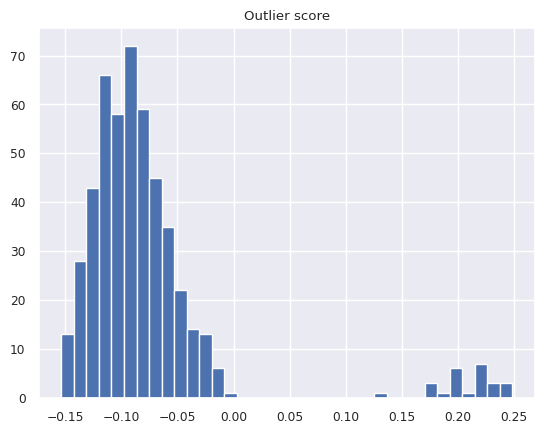

In [100]:
import matplotlib.pyplot as plt
plt.hist(y_train_scores, bins='auto') # arguments are passed to np.histogram
plt.title("Outlier score")
plt.show()

#### <font color='blue'>Paso 3: análisis estadístico descriptivo

<font color='blue'>Realicemos un análisis descriptivo de los grupos normal y outlier tanto en entrenamiento como en test. En esta ocasión utilizamos directamente el threshold calculado por Isolation Forest, pero debemos ser conscientes de que podemos emplear el valor que consideremos más oportuno (en base al histograma anterior o a cualquier otra información de que dispongamos). Dicho umbral hará que cambien las tablas que se muestran a continuación. Por ejemplo, si hacemos `threshold = isft.threshold_ - 0.05` veremos que se incrementa el porcentaje de ejemplos considerados outliers (pasando del $5\%$ al $11.2\%$).

In [101]:
threshold = isft.threshold_ # Or other value from the above histogram

def descriptive_stat_threshold(df,pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score']< threshold, 'Normal', 'Outlier')

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(columns={'Anomaly_Score':'Count'})
    cnt['Count %'] = (cnt['Count'] / cnt['Count'].sum()) * 100 # The count and count %
    stat = df.groupby('Group').mean().round(3).reset_index() # The avg.
    stat = cnt.merge(stat, left_on='Group',right_on='Group') # Put the count and the avg. together
    return (stat)

descriptive_stat_threshold(X_train,y_train_scores, threshold) #y_train_scores = isft.decision_scores_

,Group,Count,Count %,0,1,2,3,4,5,Anomaly_Score
0,Normal,475,95.0,2.003,2.011,2.006,1.991,2.008,1.985,-0.091
1,Outlier,25,5.0,0.454,-0.209,-0.475,-0.231,-0.035,-0.056,0.208


In [102]:
descriptive_stat_threshold(X_test,y_test_scores, threshold)

,Group,Count,Count %,0,1,2,3,4,5,Anomaly_Score
0,Normal,473,94.6,2.019,2.013,2.008,1.989,2.005,2.002,-0.090
1,Outlier,27,5.4,0.108,-0.335,-0.020,0.083,0.113,0.246,0.192


In [103]:
X_train[y_train==0.0].mean(axis=0)

array([2.00306716, 2.01130168, 2.00639862, 1.99140857, 2.00836738,
       1.98488673])

<font color='blue'>Las tablas de arriba incluyen los elementos esenciales para la evaluación del modelo e interpretación de resultados.

* <font color='blue'>Tamaño del grupo de outlier (`Count %`) de las tablas. Muestra un $5\%$ en cada caso ($5.2\%$ en test). Es importante recordar que el tamaño del grupo de outliers viene determinado por el threshold, que a su vez se calcula en base a la contaminación proporcionada.
* <font color='blue'>La media del score de anomalía. En las tablas, la media del score del grupo de outlier es más grande que la del grupo normal, lo que confirma que el grupo  outlier debería tener y tiene mayores scores de anomalía.
* <font color='blue'>Estadísticas relativas a las variable de entrada agrupadas en normales (grupo $0$) y atípicas (grupo $1$). Por ejemplo, el valor asociado con la columna $0$ y fila $0$ (normal) se corresponde con `X_train[y_train==0,0].mean()`, es decir, $2.003$. La segunda fila (grupo $1$) de la misma columna sería `X_train[y_train==1,0].mean()`, es decir, $0.454$. Se puede observar que la media de las características en el grupo de outliers son más pequeñas que en el grupo de ejemplos normales. Si esto tiene sentido o no depende del problema en cuestión.


<font color='blue'>Debido a que tenemos el ground truth en nuestros datos, podemos generar una matriz de confusión para entender el rendimiento del modelo.

In [104]:
def confusion_matrix_threshold(
    actual,score, threshold):
    Actual_pred = pd.DataFrame({'Actual': actual, 'Pred': score})
    Actual_pred['Pred'] = np.where(Actual_pred['Pred']<=threshold,0,1)
    cm = pd.crosstab(Actual_pred['Actual'],Actual_pred['Pred'])
    return (cm)

confusion_matrix_threshold(y_train,y_train_scores,threshold)

Pred,0,1
Actual,,
0.0,475,0
1.0,0,25


### <font color='blue'>Ejercicio.

<font color='blue'>Tras el ejemplo anterior, ahora presentamos el ejercicio a resolver por el alumnado en relación a la detección de anomalías con PyOD (https://pyod.readthedocs.io/en/latest/). En concreto, los estudiantes trabajarán con el conjunto de datos _Statlog_ (satélite Landsat) del repositorio de aprendizaje automático de la UCI (https://odds.cs.stonybrook.edu/satellite-dataset/). Se trata de un conjunto de datos de clasificación multiclase, en donde se combinan las tres clases más pequeñas para formar la clase de valores atípicos. En PRADO el alumnado dispone del fichero `satellite.mat` con los datos necesarios para realizar el ejercicio. A continuación se aporta una descripción general del dataset:
* <font color='blue'> $X$ = datos puntuales multidimensionales,
* <font color='blue'> $y$ = etiquetas ($1$ = valores atípicos, $0$ = valores atípicos).
* <font color='blue'> $6435$ instancias, $36$ características y $2036$ ($32\%$) anomalías. Este último número se puede recuperar haciendo `np.sum(Y==1)`.

<font color='blue'> Referencias:
* <font color='blue'>  Liu, Fei Tony, Kai Ming Ting, and Zhi-Hua Zhou. “Isolation forest.” 2008 Eighth IEEE International Conference on Data Mining. IEEE, 2008.
* <font color='blue'>  K. M. Ting, J. T. S. Chuan, and F. T. Liu. “Mass: A New Ranking Measure for Anomaly Detection.“, IEEE Transactions on Knowledge and Data Engineering, 2009.




## <font color='blue'> Objetivos
    
<font color='blue'> El objetivo del presente ejercicio es analizar los patrones subyacentes a los datos, sin tomar en cuenta su _ground truth_, y determinar si las anomalías que se detectan con algoritmos avanzados coinciden con la realidad. Se debe usar un algoritmo cualquiera de la librería PyOD (https://github.com/yzhao062/pyod), como podría ser Isolation Forest. Se valorará positivamente que el estudiante escoga un algoritmo diferente, en cuyo caso, se proporcionará una breve explicación de su funcionamiento.

<font color='blue'> Para llevar a cabo este objetivo principal se llevarán a cabo los siguientes objetivos secundarios:
1. <font color='blue'> Realización de un análisis exploratorio para una primera observación de las distribuciones de los datos.
2. Construcción y ajuste del modelo.
3. Experimentación y determinación de los umbrales más razonables para la identificación de anomalías.
4. Comprobación de errores usando la información Ground Truth del conjunto de datos.

### <font color='blue'> Resultados Esperados
<font color='blue'> Se espera que los resultados que se obtengan de la detección de anomalías sean razonablemente parecidos a la realidad.
    
<font color='blue'>Como el fichero es un `.mat` (matlab), lo primero que haremos será tranformarlo en `.csv` para trabajar con él. Nos quedamos solo con la parte no supervisada (es decir, con las entradas, sin las salidas deseadas / etiquetas).

In [105]:
import scipy.io
import pandas as pd

from google.colab import drive
drive.mount("/content/drive/")

dataFolder = 'drive/MyDrive/Colab Notebooks/clustering/'

# Cargar el archivo .mat
mat = scipy.io.loadmat(dataFolder + '/satellite.mat')
print(mat.keys())

X = mat['X']
Y = mat['y']
Y = Y.flatten()

# Convertir a un DataFrame de pandas ignorando las etiquetas
# IMPORTANTE: estamos ante un problema no supervisado. No podemos emplear las etiquetas para agrupar o analizar los datos.
df = pd.DataFrame(X)

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
dict_keys(['__header__', '__version__', '__globals__', 'X', 'y'])


In [106]:
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
0,92,115,120,94,84,102,106,79,84,102,102,83,101,126,133,103,92,112,118,85,84,103,104,81,102,126,134,104,88,121,128,100,84,107,113,87
1,84,102,106,79,84,102,102,83,80,102,102,79,92,112,118,85,84,103,104,81,84,99,104,78,88,121,128,100,84,107,113,87,84,99,104,79
2,84,102,102,83,80,102,102,79,84,94,102,79,84,103,104,81,84,99,104,78,84,99,104,81,84,107,113,87,84,99,104,79,84,99,104,79
3,80,102,102,79,84,94,102,79,80,94,98,76,84,99,104,78,84,99,104,81,76,99,104,81,84,99,104,79,84,99,104,79,84,103,104,79
4,84,94,102,79,80,94,98,76,80,102,102,79,84,99,104,81,76,99,104,81,76,99,108,85,84,99,104,79,84,103,104,79,79,107,109,87
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6430,60,83,96,85,64,87,100,88,64,83,104,88,59,83,100,83,63,87,100,87,63,83,104,87,66,91,104,92,66,87,108,89,63,83,104,85
6431,64,79,100,85,56,71,96,85,56,68,91,81,63,79,100,87,59,75,96,87,59,72,96,83,63,83,100,85,66,83,100,85,63,83,100,81
6432,56,68,91,81,56,64,91,81,53,64,83,78,59,72,96,83,59,75,96,75,59,75,89,75,63,83,100,81,59,87,96,81,63,83,92,74
6433,56,68,87,74,60,71,91,81,60,64,104,99,59,79,89,71,63,79,93,75,63,68,109,92,59,83,96,74,59,83,92,74,59,83,92,70


### 1 - Análisis exploratorio de los datos:

Veamos primero entre qué valores oscila cada una de las características:

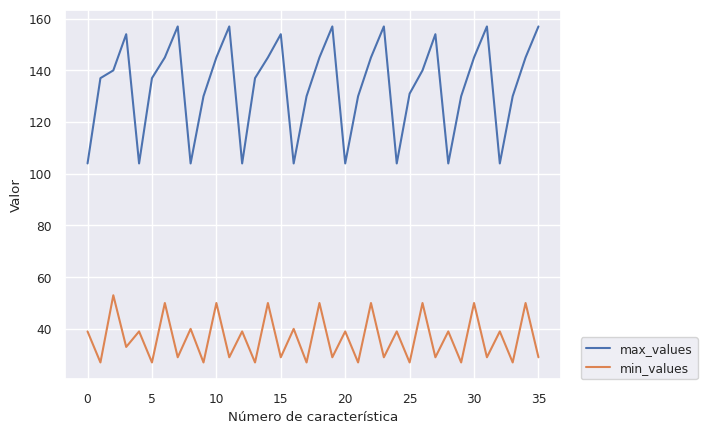

In [107]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

numFeatures = 36
plt.plot(list(range(0,numFeatures)), df.max(), label = 'max_values')
plt.plot(list(range(0,numFeatures)), df.min(), label = 'min_values')

plt.xlabel("Número de característica")
plt.ylabel("Valor")

plt.legend(loc=(1.04, 0.0))
plt.show()

Existe mucha diferencia entre unos atributos y otros.

Veamos cómo se distribuyen los datos estadísticamente:

In [108]:
df.describe()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35
count,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000,6435.000000
mean,69.400000,83.594872,99.290598,82.592696,69.150272,83.243512,99.110645,82.497125,68.912354,82.893085,98.853302,82.388190,69.289666,83.476768,99.311267,82.644911,69.045688,83.171096,99.149806,82.603263,68.839316,82.860917,98.949650,82.468531,69.162393,83.373427,99.214763,82.660606,68.944056,83.145610,99.111888,82.618026,68.727584,82.858897,98.926030,82.505361
std,13.605871,22.882234,16.645944,18.897674,13.561197,22.886495,16.664088,18.940923,13.470599,22.862255,16.636608,18.981112,13.602694,22.849895,16.667866,18.931989,13.537618,22.905065,16.717671,19.035543,13.459225,22.884380,16.729623,19.070751,13.580516,22.802737,16.612514,18.991281,13.492684,22.847199,16.704305,19.043661,13.401603,22.816959,16.695488,19.054274
min,39.000000,27.000000,53.000000,33.000000,39.000000,27.000000,50.000000,29.000000,40.000000,27.000000,50.000000,29.000000,39.000000,27.000000,50.000000,29.000000,40.000000,27.000000,50.000000,29.000000,39.000000,27.000000,50.000000,29.000000,39.000000,27.000000,50.000000,29.000000,39.000000,27.000000,50.000000,29.000000,39.000000,27.000000,50.000000,29.000000
25%,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,68.000000,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,68.000000,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,69.000000,60.000000,71.000000,85.000000,68.000000
50%,68.000000,87.000000,101.000000,81.000000,68.000000,85.000000,101.000000,81.000000,67.000000,85.000000,100.000000,81.000000,68.000000,85.000000,101.000000,81.000000,68.000000,85.000000,100.000000,81.000000,67.000000,84.000000,100.000000,81.000000,68.000000,85.000000,100.000000,81.000000,68.000000,85.000000,100.000000,81.000000,67.000000,84.000000,100.000000,81.000000
75%,80.000000,103.000000,113.000000,92.000000,80.000000,103.000000,113.000000,92.000000,79.000000,102.000000,113.000000,92.000000,80.000000,103.000000,113.000000,92.000000,79.000000,103.000000,113.000000,92.000000,79.000000,103.000000,113.000000,92.000000,79.000000,103.000000,113.000000,92.000000,79.000000,103.000000,113.000000,92.000000,79.000000,103.000000,113.000000,92.000000
max,104.000000,137.000000,140.000000,154.000000,104.000000,137.000000,145.000000,157.000000,104.000000,130.000000,145.000000,157.000000,104.000000,137.000000,145.000000,154.000000,104.000000,130.000000,145.000000,157.000000,104.000000,130.000000,145.000000,157.000000,104.000000,131.000000,140.000000,154.000000,104.000000,130.000000,145.000000,157.000000,104.000000,130.000000,145.000000,157.000000


Podemos intentar, como en el caso anterior, representar dos características para ver como se ven los datos gráficamente:

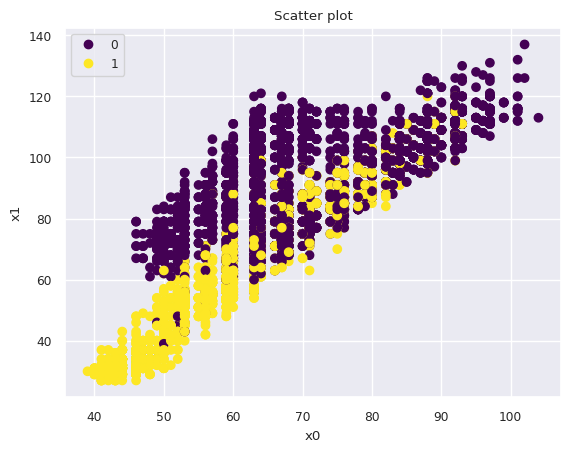

In [109]:
scatter = plt.scatter(df[0], df[1], c=Y, cmap='viridis')
plt.legend(*scatter.legend_elements())
plt.title('Scatter plot')
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

, donde el 0 son los valores inlier y 1 los valores outlier.

Parece que, en este caso, con solo dos características no vamos a poder detectar los outliers tan fácilmente.

### 2 - Construcción y ajuste del modelo:

In [110]:
contamination = np.sum(Y==1) / len(Y)

In [111]:
from pyod.models.iforest import IForest
isft = IForest(contamination= contamination, max_samples=40, behaviour='new', random_state=42)
isft.fit(X)

# Training data
y_scores = isft.decision_function(X)
y_pred = isft.predict(X)

# Threshold for the defined comtanimation rate
print("The threshold for the defined contamination rate:" , isft.threshold_)

def count_stat(vector):
    # Because it is '0' and '1', we can run a count statistic.
    unique, counts = np.unique(vector, return_counts=True)
    return dict(zip(unique, counts))

print("Data :", count_stat(y_pred))

The threshold for the defined contamination rate: -9.346585056477577e-18
Data : {0: 4399, 1: 2036}


In [112]:
X.shape[0]*contamination

2036.0

Obtenemos lo esperado, 2036 anomalías y 4399 (6435 - 2036) que no lo son.

También obtenemos que el el umbral es prácticamente 0. Veamos ahora si es razonable ese valor.

Representemos primero cómo ha clasificado los datos:

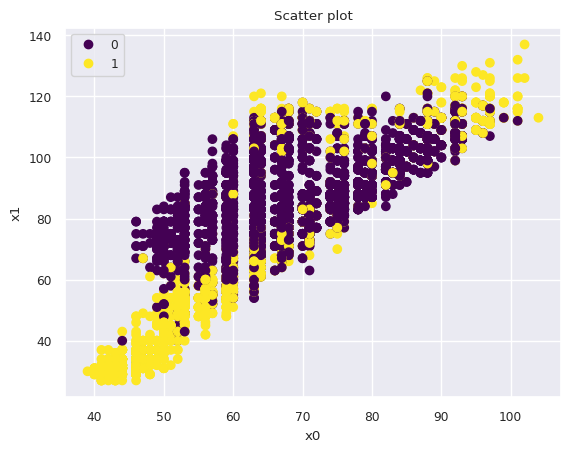

In [113]:
scatter = plt.scatter(df[0], df[1], c=y_pred, cmap='viridis')
plt.legend(*scatter.legend_elements())
plt.title('Scatter plot')
plt.xlabel('x0')
plt.ylabel('x1')
plt.show()

que, salvo ciertas zonas no se parece prácticamente en nada al anterior diagrama, realizado con el ground Truth.

Veamos ahora la importancia que tienen las distintas características:

In [114]:
isft_vi = isft.feature_importances_
isft_vi

array([0.02287218, 0.02626146, 0.03986339, 0.02651652, 0.02556314,
       0.03313826, 0.0224212 , 0.02721068, 0.02923232, 0.02197384,
       0.01998698, 0.03053708, 0.02977672, 0.02031348, 0.02423438,
       0.02510417, 0.03773434, 0.02722756, 0.02917841, 0.01856114,
       0.02921162, 0.02294671, 0.02769821, 0.02940889, 0.02488364,
       0.02969288, 0.02554812, 0.03138609, 0.02887167, 0.03883882,
       0.02885296, 0.03099502, 0.02716862, 0.03396392, 0.02844425,
       0.02438134])

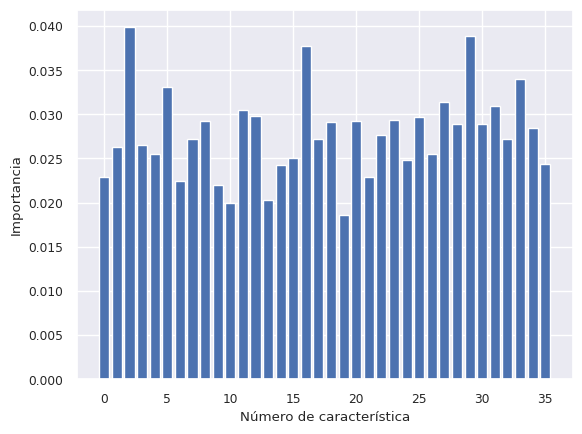

In [115]:
from matplotlib import pyplot as plt
plt.bar(list(range(numFeatures)), isft_vi)
plt.xlabel('Número de característica')
plt.ylabel('Importancia')
plt.show()

Vemos que las características más importantes son la 2, la 16 y la 29, aunque la mayoría de características aportan una información similar, sin llegar a superar ninguna 0.04.

### 3 - Determinación de umbral

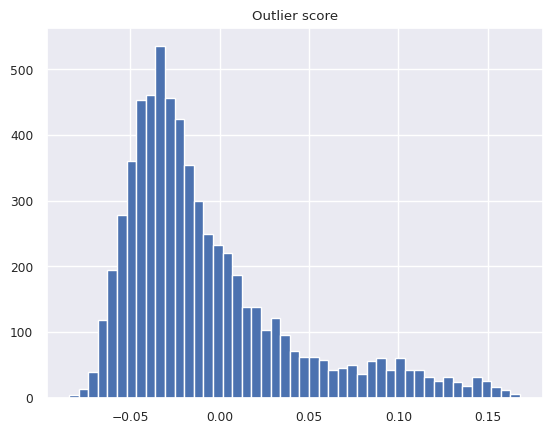

In [116]:
import matplotlib.pyplot as plt
plt.hist(y_scores, bins='auto') # arguments are passed to np.histogram
plt.title("Outlier score")
plt.show()

Comprobamos que el umbral que ha obtenido el modelo (~0) es excesivamente bajo, y sería más correcto un valor más cercano a 0.05.

Elegir dicho valor provocará que clasifiquemos algunos valores como "normales", a pesar de ser outlier.

### 4 - Comprobación de errores con el ground Truth

Evaluamos el resultado de nuestro clasificador utilizando $Y$:

In [117]:
# threshold = isft.threshold_ # Or other value from the above histogram
threshold = 0.05

def descriptive_stat_threshold(df,pred_score, threshold):
    # Let's see how many '0's and '1's.
    df = pd.DataFrame(df)
    df['Anomaly_Score'] = pred_score
    df['Group'] = np.where(df['Anomaly_Score']< threshold, 'Normal', 'Outlier')

    # Now let's show the summary statistics:
    cnt = df.groupby('Group')['Anomaly_Score'].count().reset_index().rename(columns={'Anomaly_Score':'Count'})
    cnt['Count %'] = (cnt['Count'] / cnt['Count'].sum()) * 100 # The count and count %
    stat = df.groupby('Group').mean().round(3).reset_index() # The avg.
    stat = cnt.merge(stat, left_on='Group',right_on='Group') # Put the count and the avg. together
    return (stat)

descriptive_stat_threshold(X,y_scores, threshold) #y_train_scores = isft.decision_scores_

,Group,Count,Count %,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,Anomaly_Score
0,Normal,5616,87.272727,71.727,88.745,98.013,79.025,71.515,88.429,97.806,78.895,71.204,87.944,97.517,78.818,71.711,88.839,97.936,78.836,71.555,88.681,97.733,78.700,71.285,88.237,97.534,78.662,71.506,88.603,97.856,78.927,71.381,88.561,97.773,78.842,71.136,88.234,97.619,78.816,-0.022
1,Outlier,819,12.727273,53.446,48.280,108.050,107.055,52.932,47.687,108.054,107.200,53.198,48.258,108.016,106.867,52.689,46.707,108.741,108.761,51.836,45.392,108.867,109.365,52.072,45.994,108.658,108.569,53.094,47.514,108.531,108.260,52.231,46.009,108.291,108.512,52.216,46.002,107.891,107.801,0.097


In [118]:
X[Y==0].mean(axis=0)

array([ 72.78767902,  92.34416913, 100.02114117,  80.09843146,
        72.69652194,  92.28188225,  99.91088884,  80.03500796,
        72.43669016,  91.89520346,  99.61172994,  79.87838145,
        72.72311889,  92.36690157,  99.9711298 ,  79.99613549,
        72.64855649,  92.43509889,  99.8965674 ,  79.94294158,
        72.41759491,  92.07433508,  99.63832689,  79.81950443,
        72.37144806,  91.82837008,  99.79699932,  80.07047056,
        72.34416913,  92.07069789,  99.76676517,  79.98545124,
        72.15276199,  91.86587861,  99.55558081,  79.84541941])

In [119]:
X[Y==1].mean(axis=0)

array([62.0805501 , 64.6910609 , 97.71218075, 87.98182711, 61.48821218,
       63.7151277 , 97.38163065, 87.81679764, 61.29764244, 63.44302554,
       97.21463654, 87.81090373, 61.87131631, 64.26866405, 97.88555992,
       88.36787819, 61.26129666, 63.15520629, 97.53634578, 88.35117878,
       61.10805501, 62.9543222 , 97.46168959, 88.19204322, 62.22888016,
       65.10559921, 97.956778  , 88.25687623, 61.59774067, 63.86198428,
       97.69695481, 88.30599214, 61.32711198, 63.39833006, 97.56581532,
       88.2524558 ])

Comprobamos que los valores no son excesivamente parecidos.

Comprobamos el funcionamiento del clasificador utilizando una matriz de confusión:

In [120]:
def confusion_matrix_threshold(
    actual,score, threshold):
    Actual_pred = pd.DataFrame({'Actual': actual, 'Pred': score})
    Actual_pred['Pred'] = np.where(Actual_pred['Pred']<=threshold,0,1)
    cm = pd.crosstab(Actual_pred['Actual'],Actual_pred['Pred'])
    return (cm)

confusion_matrix_threshold(Y,y_scores,threshold)

Pred,0,1
Actual,,
0,4327,72
1,1289,747


Como sospechábamos, apenas clasificamos datos "normales" como outliers, pero clasificamos muchos outliers como datos "normales".

Por último, podemos representar gráficamente variando el $threshold$ el rendimiento de nuestro clasificador. Para ello, calcularemos el [AUC](https://developers.google.com/machine-learning/crash-course/classification/roc-and-auc?hl=es-419):

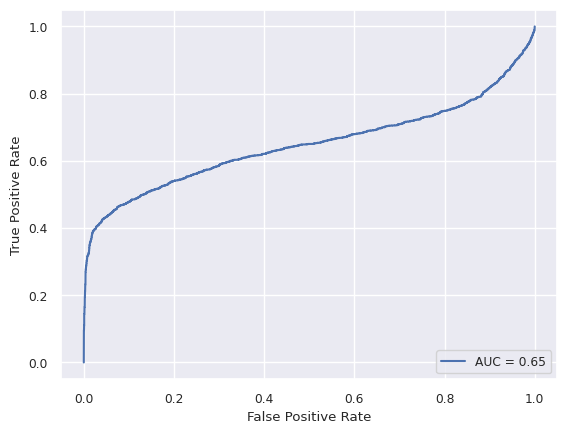

In [121]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import RocCurveDisplay

fpr, tpr, thresholds = roc_curve(Y, y_scores)
roc_auc = auc(fpr, tpr)
RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc).plot()
plt.show()

Se obtiene un área bajo la curva de 0.65, lo cual no es muy elevado (un clasificador aleatorio, obtendría 0.5).

Esto muestra la complejidad de determinar los outliers en este conjunto, ya que aunque son datos poco comunes, son datos que en un principio pertenecían a tres clases distintas de los datos "normales", lo cual dificulta que el iForest los identifique claramente como outliers.